# **Importing library&function**






In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.preprocessing import OneHotEncoder
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, mean_squared_error, auc
from IPython.core.display import display, HTML
import numpy as np
import time
import os
from google.colab import drive
import itertools

!pip install split_folders
import splitfolders

!pip install scikit-learn

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/
loc = "/content/drive/MyDrive/ColabNotebooks/FinalProject/Dataset/types/"

cataract  diabetic_retinopathy	glaucoma  normal


In [116]:
splitfolders.ratio(loc,output = "output1",ratio = (0.70,0.15,0.15))
for dirpath,dirname,filename in os.walk("./output1"):
  print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

Copying files: 4217 files [00:09, 461.98 files/s]


There are 3 directories and 0 images in './output1'.
There are 4 directories and 0 images in './output1/train'.
There are 0 directories and 830 images in './output1/train/cataract'.
There are 0 directories and 805 images in './output1/train/glaucoma'.
There are 0 directories and 859 images in './output1/train/normal'.
There are 0 directories and 878 images in './output1/train/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/test'.
There are 0 directories and 157 images in './output1/test/cataract'.
There are 0 directories and 152 images in './output1/test/glaucoma'.
There are 0 directories and 162 images in './output1/test/normal'.
There are 0 directories and 166 images in './output1/test/diabetic_retinopathy'.
There are 4 directories and 0 images in './output1/val'.
There are 0 directories and 207 images in './output1/val/cataract'.
There are 0 directories and 201 images in './output1/val/glaucoma'.
There are 0 directories and 215 images in './output1/val/norm

In [117]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor = "val_loss",patience = 6,
                                             min_delta = 0.0001)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = "val_loss",factor = 0.2,
                                                patience = 4,min_lr = 1e-7)

In [118]:
data_aug = tf.keras.Sequential([
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomHeight(0.2),
    # preprocessing.RandomRotation(0.2),
    # preprocessing.RandomFlip("horizontal")
],name = "data_augmentation_layer")

In [119]:
def predict_labels(model, X_test):
    return model.predict(X_test)

def display_classification_report(y_test, y_pred):
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

def calculate_specificity(y_test, y_pred):
    # tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    # specificity = tn / (tn + fp)
    # print(f"Specificity: {specificity}")
    cm = confusion_matrix(y_test, y_pred)
    specificity = []
    for i in range(cm.shape[0]):
      spec = cm[i, i] / (np.sum(cm[i, :]) - cm[i, i] + np.sum(cm[:, :]) - np.sum(cm[i, :]))
      specificity.append(spec)
    print(f"Specificity: {specificity}")

def plot_loss_curves(history):
  """
  Returns separate loss curves for training and validation metrics.
  """
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
    # Create the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]  # normalize
    n_classes = cm.shape[0]  # find the number of classes

    specificity = []  # To store specificity values for each class

    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues)
    fig.colorbar(cax)

    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])

    ax.set(
        title="Confusion Matrix",
        xlabel="Predicted label",
        ylabel="True label",
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels
    )

    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()

    plt.xticks(rotation=70, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    threshold = (cm.max() + cm.min()) / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        specificity_val = (cm.sum() - cm[i].sum() - cm[:, j].sum() + cm[i, j]) / (
            cm.sum() - cm[:, j].sum()
        )
        specificity.append(specificity_val)

        if norm:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%,\n {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%, Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )
        else:
            plt.text(
                j,
                i,
                f"{cm[i, j]} ( {specificity_val*100:.1f}%)",
                #  f"{cm[i, j]} (Specificity: {specificity_val*100:.1f}%)",
                horizontalalignment="center",
                color="white" if cm[i, j] > threshold else "black",
                size=text_size,
            )

    if savefig:
        fig.savefig("confusion_matrix.png")

    return specificity

def calculate_mse(y_test, y_probs, n_classes):
  y_true_onehot = tf.keras.utils.to_categorical(y_test, n_classes)
  mse = mean_squared_error(y_true_onehot, y_probs)
  print(f"Mean Squared Error: : {mse}")
  return y_true_onehot

def calculate_roc_auc_score(y_test, y_probs):
  auc_roc = roc_auc_score(y_test, y_probs, multi_class='ovr', average=None)
  average_auc_roc = np.mean(auc_roc)
  print(f"The average AUC-ROC is {average_auc_roc}")

# **Batch Size: 16**

In [120]:
epoch = 20
batchsize = 16

In [121]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 842 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [122]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [123]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_9  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_27 (Dense)            (None, 32)                49184     
                                                           

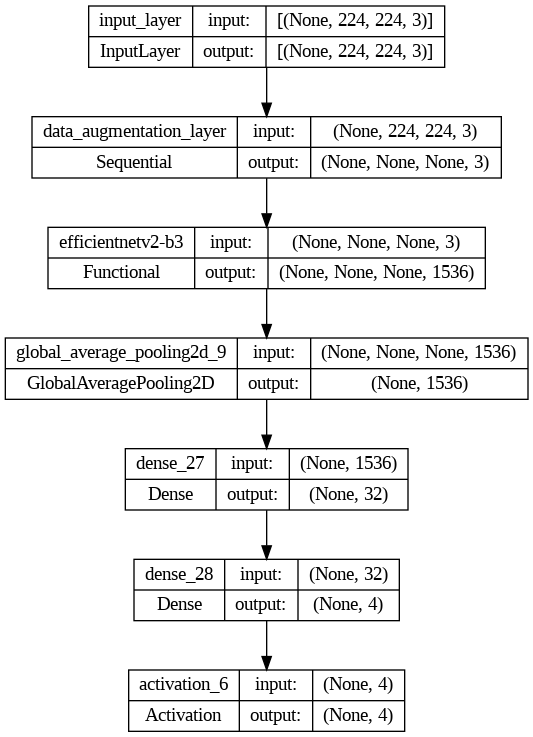

In [124]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [125]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [126]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 26s 74ms/step - loss: 0.6710 - accuracy: 0.7372 - val_loss: 0.4369 - val_accuracy: 0.8337 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 13s 63ms/step - loss: 0.4746 - accuracy: 0.8144 - val_loss: 0.3810 - val_accuracy: 0.8361 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 14s 64ms/step - loss: 0.4277 - accuracy: 0.8366 - val_loss: 0.4538 - val_accuracy: 0.8290 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 14s 65ms/step - loss: 0.3922 - accuracy: 0.8529 - val_loss: 0.3321 - val_accuracy: 0.8658 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 13s 63ms/step - loss: 0.3638 - accuracy: 0.8597 - val_loss: 0.3350 - val_accuracy: 0.8670 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 13s 63ms/step - loss: 0.3535 - accuracy: 0.8663 - val_loss: 0.3575 - val_accuracy: 0.8599 - lr: 0.0010
Epoch 7/20
211/211 [==============================] - 13s 

EfficientNetV2B3 Evaluation

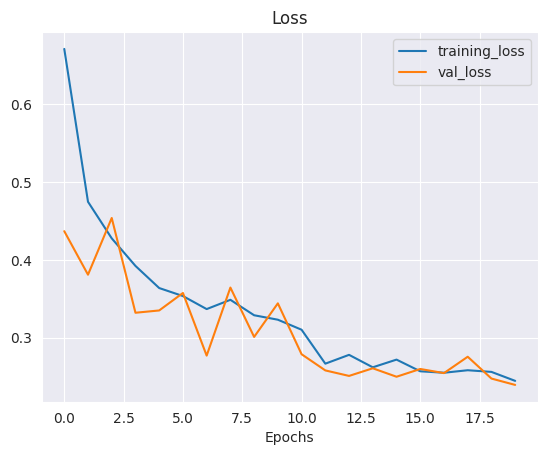

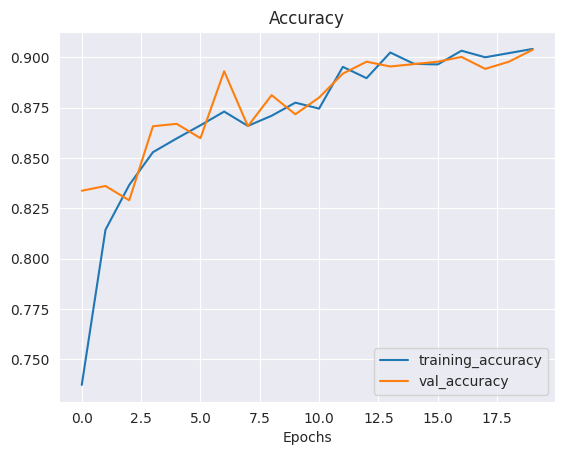

In [127]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 2s 43ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.96      0.95       157
           1       0.98      0.99      0.99       166
           2       0.93      0.80      0.86       152
           3       0.86      0.94      0.90       162

    accuracy                           0.93       637
   macro avg       0.93      0.92      0.92       637
weighted avg       0.93      0.93      0.93       637

Specificity: [0.31069958847736623, 0.3495762711864407, 0.23689320388349513, 0.3134020618556701]
Mean Squared Error: : 0.10840695351362228
The average AUC-ROC is 0.9866623950724044


[0.9873684210526316,
 0.6652452025586354,
 0.6936758893280632,
 0.6681127982646421,
 0.6505263157894737,
 0.997867803837953,
 0.6719367588932806,
 0.6420824295010846,
 0.6989473684210527,
 0.6801705756929638,
 0.9407114624505929,
 0.7114967462039046,
 0.6631578947368421,
 0.6567164179104478,
 0.6936758893280632,
 0.9783080260303688]

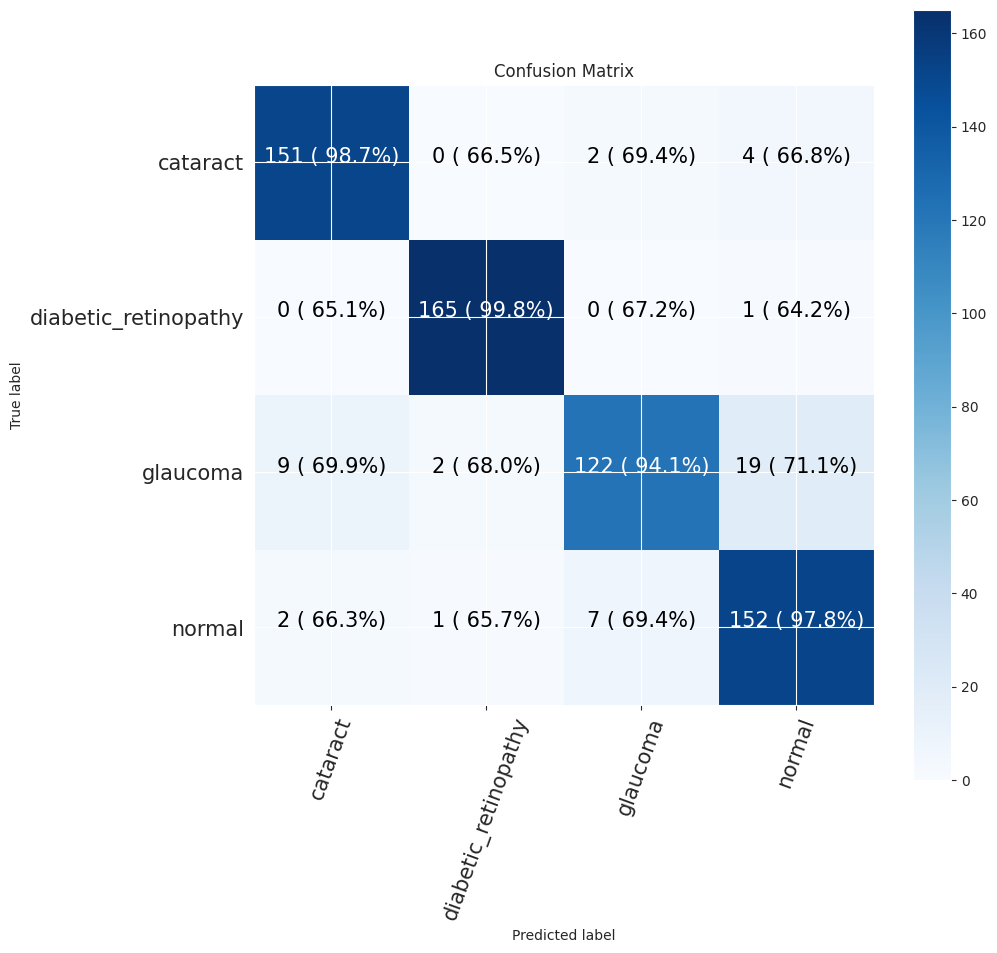

In [128]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


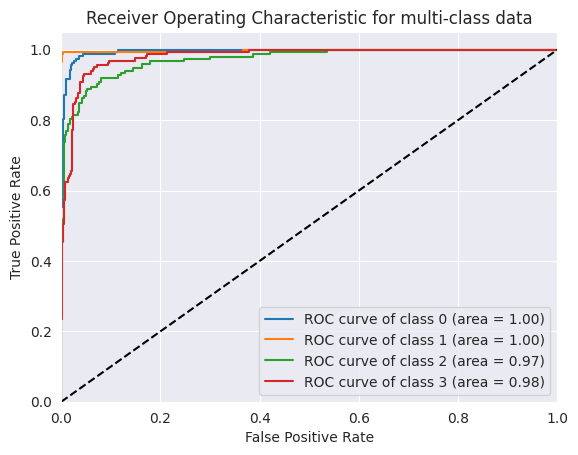

In [129]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [130]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [131]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPooli  (None, 26, 26, 128)      

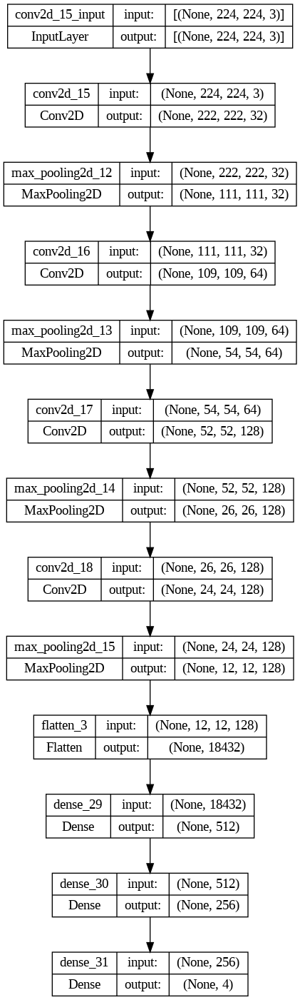

In [132]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [133]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [134]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 7s 24ms/step - loss: 0.7810 - accuracy: 0.5744 - val_loss: 0.3098 - val_accuracy: 0.7150 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 5s 23ms/step - loss: 0.3002 - accuracy: 0.6957 - val_loss: 0.2888 - val_accuracy: 0.7399 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2861 - accuracy: 0.7106 - val_loss: 0.2709 - val_accuracy: 0.7352 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2833 - accuracy: 0.7114 - val_loss: 0.2838 - val_accuracy: 0.7363 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2801 - accuracy: 0.7132 - val_loss: 0.2683 - val_accuracy: 0.7411 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 5s 23ms/step - loss: 0.2646 - accuracy: 0.7331 - val_loss: 0.2634 - val_accuracy: 0.7340 - lr: 0.0010
Epoch 7/20
211/211 [==============================] - 5s 23ms/st

CNN Evaluation

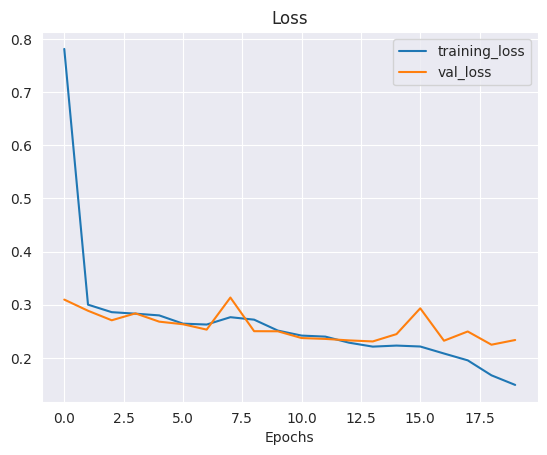

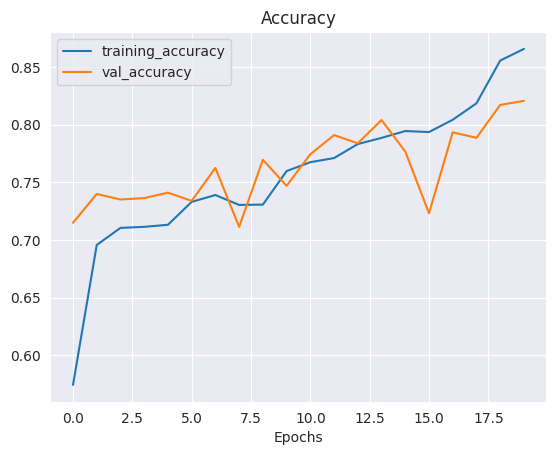

In [135]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 0s 9ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.51      0.59       157
           1       0.99      0.99      0.99       166
           2       0.58      0.66      0.62       152
           3       0.73      0.83      0.77       162

    accuracy                           0.75       637
   macro avg       0.75      0.75      0.74       637
weighted avg       0.76      0.75      0.75       637

Specificity: [0.1436265709156194, 0.3495762711864407, 0.186219739292365, 0.2664015904572565]
Mean Squared Error: : 0.12960752844810486
The average AUC-ROC is 0.8980651953850596


[0.8527724665391969,
 0.6666666666666666,
 0.771551724137931,
 0.7108167770419426,
 0.6826003824091779,
 0.9978768577494692,
 0.6443965517241379,
 0.6335540838852097,
 0.762906309751434,
 0.6772823779193206,
 0.8879310344827587,
 0.717439293598234,
 0.7017208413001912,
 0.6581740976645435,
 0.6961206896551724,
 0.9381898454746137]

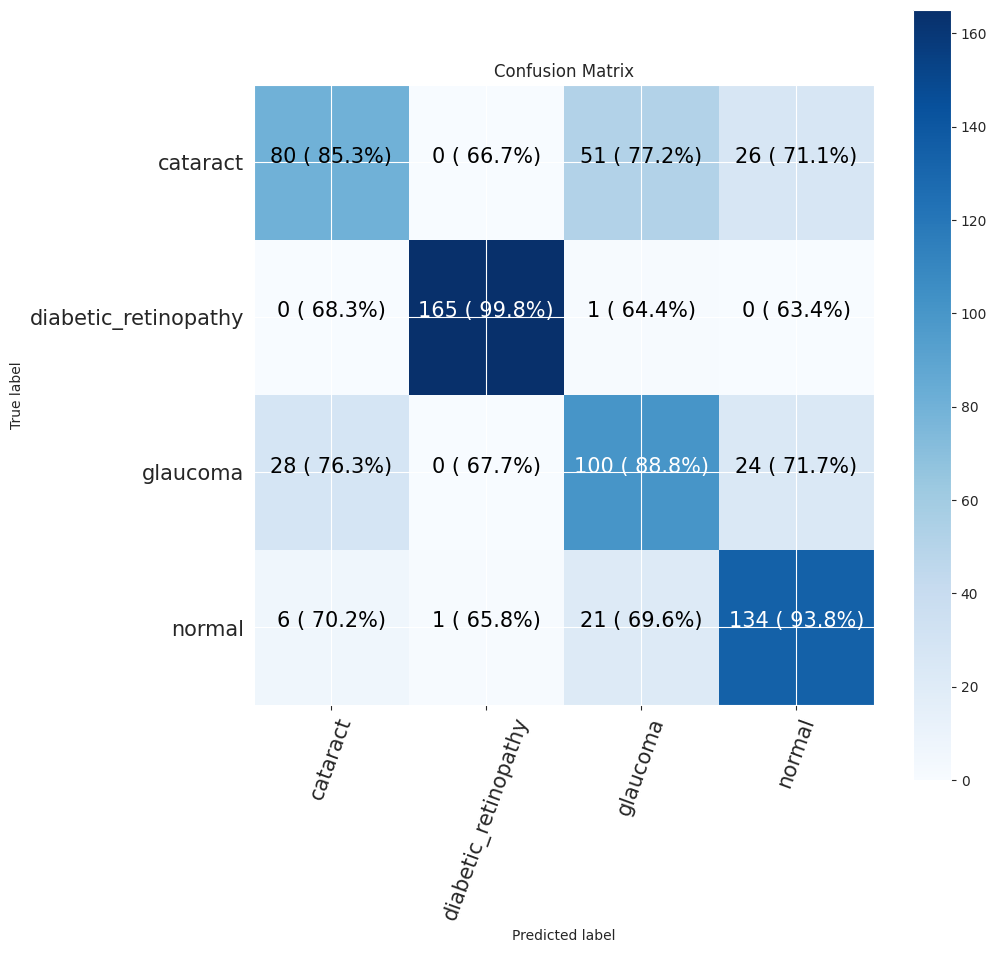

In [136]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


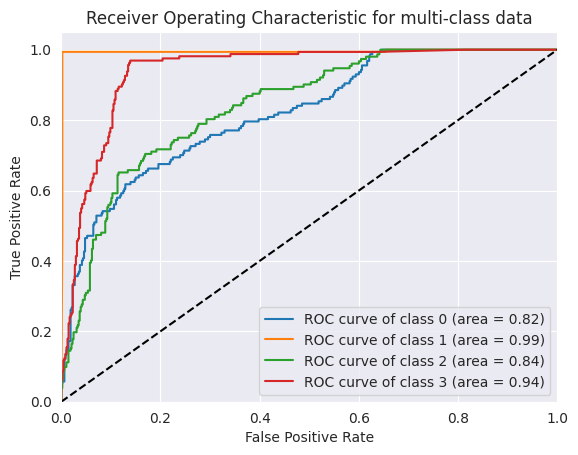

In [137]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [138]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [139]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_19 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 0 (GlobalAveragePooling2D)                                      
                                                                 
 dense_32 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_33 (Dense)            (None, 4)                 4100      
                                                          

In [140]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

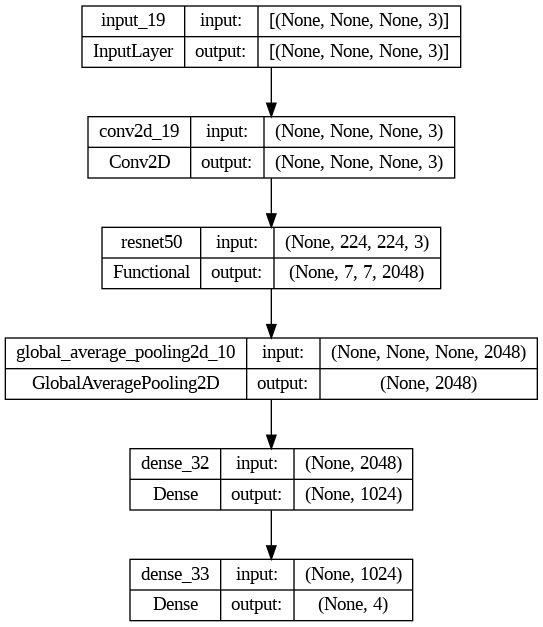

In [141]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [142]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [143]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 37s 149ms/step - loss: 0.2746 - accuracy: 0.7794 - val_loss: 0.1900 - val_accuracy: 0.8527 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 31s 145ms/step - loss: 0.1690 - accuracy: 0.8698 - val_loss: 0.1420 - val_accuracy: 0.8872 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 31s 144ms/step - loss: 0.1440 - accuracy: 0.8870 - val_loss: 0.1446 - val_accuracy: 0.8931 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 31s 145ms/step - loss: 0.1301 - accuracy: 0.8950 - val_loss: 0.1043 - val_accuracy: 0.9204 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 31s 144ms/step - loss: 0.1153 - accuracy: 0.9116 - val_loss: 0.1231 - val_accuracy: 0.9145 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 31s 144ms/step - loss: 0.1041 - accuracy: 0.9208 - val_loss: 0.0949 - val_accuracy: 0.9287 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet50 Evaluation

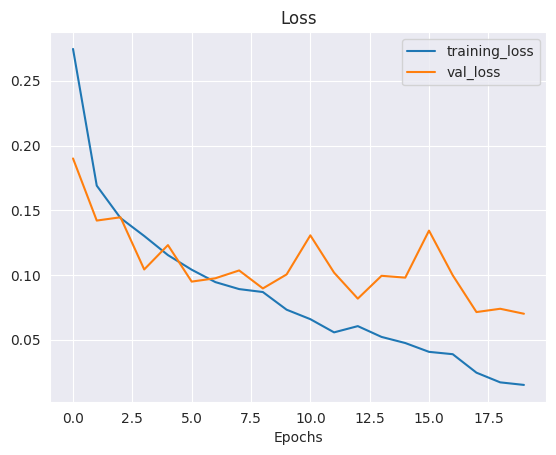

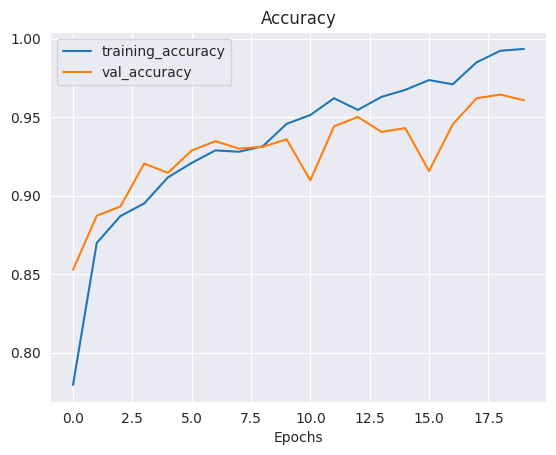

In [144]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 2s 50ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       157
           1       1.00      0.99      1.00       166
           2       0.85      0.84      0.85       152
           3       0.89      0.86      0.87       162

    accuracy                           0.92       637
   macro avg       0.91      0.91      0.91       637
weighted avg       0.91      0.92      0.91       637

Specificity: [0.31069958847736623, 0.3495762711864407, 0.25147347740667975, 0.2791164658634538]
Mean Squared Error: : 0.10363307595252991
The average AUC-ROC is 0.9875082605443191


[0.9872881355932204,
 0.6673728813559322,
 0.6878850102669405,
 0.675,
 0.6483050847457628,
 0.9978813559322034,
 0.6611909650924025,
 0.6541666666666667,
 0.6927966101694916,
 0.6779661016949152,
 0.9507186858316222,
 0.71875,
 0.6716101694915254,
 0.6567796610169492,
 0.7002053388090349,
 0.9520833333333333]

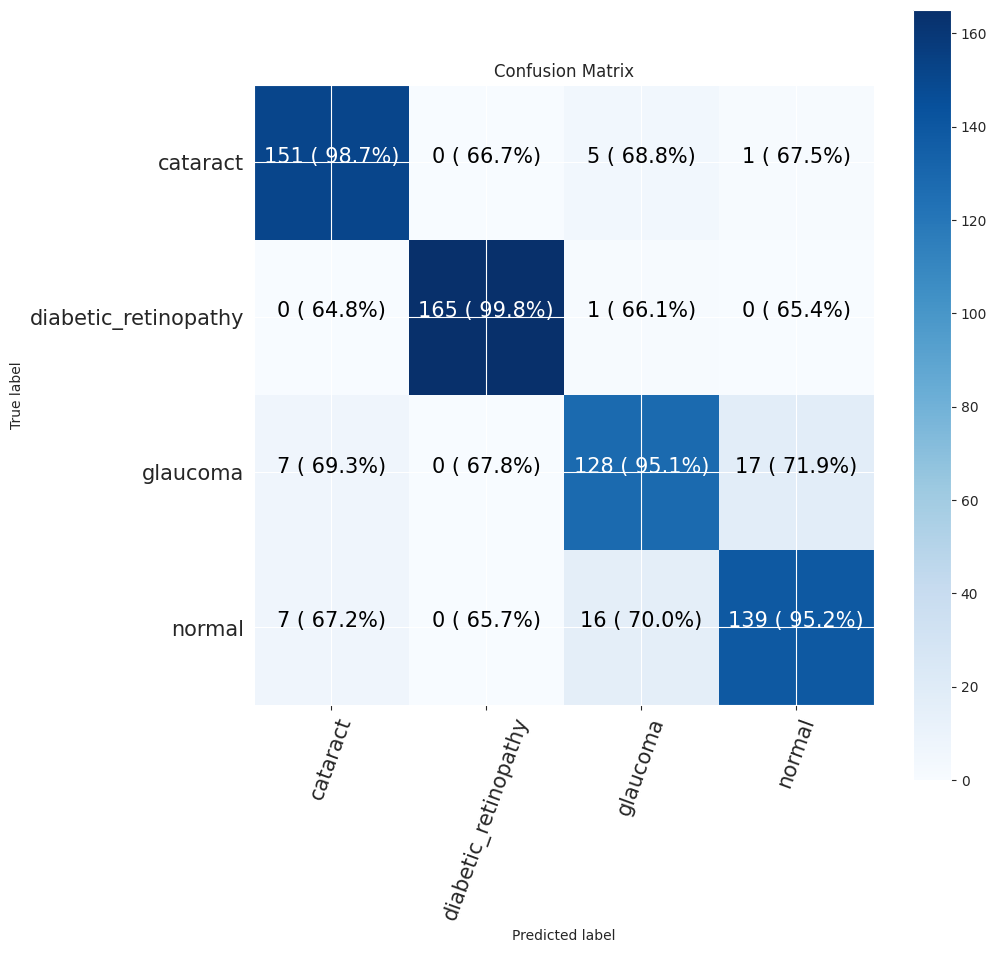

In [145]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


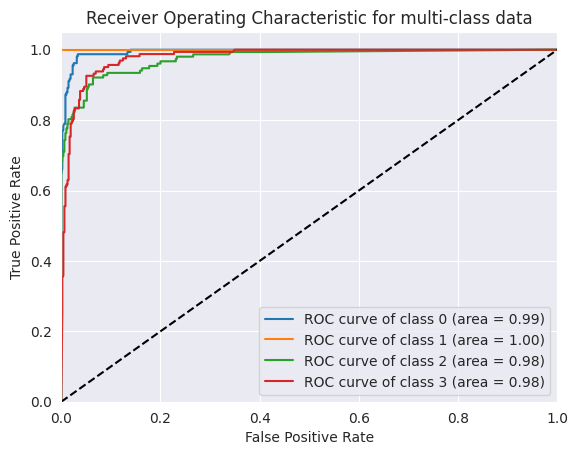

In [146]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [147]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [148]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



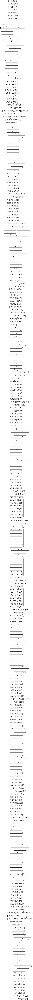

In [149]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [150]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 1 (GlobalAveragePooling2D)                                      
                                                                 
 dense_34 (Dense)            (None, 32)                65568     
                                                          

In [151]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [152]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
211/211 [==============================] - 33s 130ms/step - loss: 0.6060 - accuracy: 0.7598 - val_loss: 0.5648 - val_accuracy: 0.8064 - lr: 0.0010
Epoch 2/20
211/211 [==============================] - 26s 122ms/step - loss: 0.4319 - accuracy: 0.8307 - val_loss: 0.4560 - val_accuracy: 0.8456 - lr: 0.0010
Epoch 3/20
211/211 [==============================] - 25s 118ms/step - loss: 0.3881 - accuracy: 0.8461 - val_loss: 0.3783 - val_accuracy: 0.8658 - lr: 0.0010
Epoch 4/20
211/211 [==============================] - 26s 120ms/step - loss: 0.3370 - accuracy: 0.8683 - val_loss: 0.4086 - val_accuracy: 0.8409 - lr: 0.0010
Epoch 5/20
211/211 [==============================] - 26s 122ms/step - loss: 0.3340 - accuracy: 0.8725 - val_loss: 0.4170 - val_accuracy: 0.8622 - lr: 0.0010
Epoch 6/20
211/211 [==============================] - 25s 119ms/step - loss: 0.3171 - accuracy: 0.8778 - val_loss: 0.3533 - val_accuracy: 0.8741 - lr: 0.0010
Epoch 7/20
211/211 [==============================] 

ResNet101 Evaluation

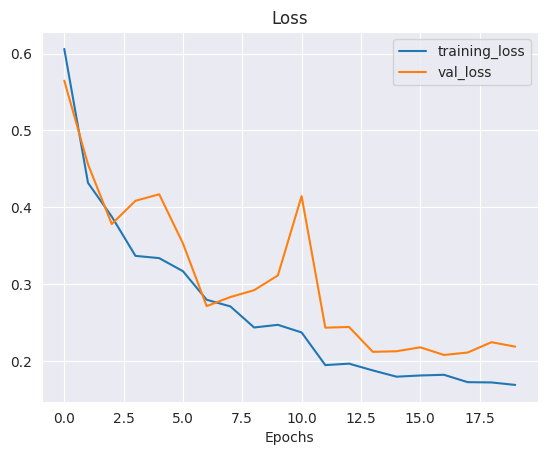

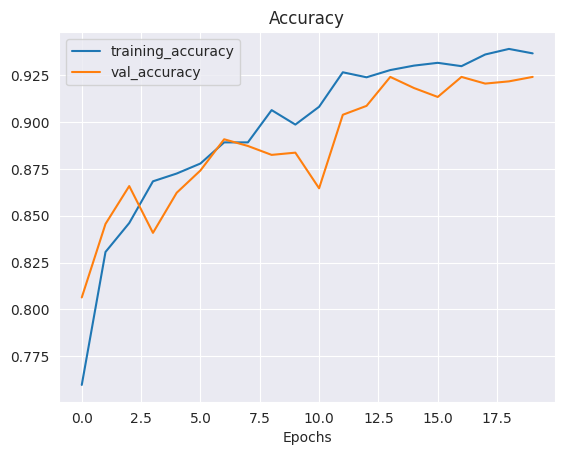

In [153]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


40/40 [==============================] - 3s 82ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       157
           1       0.97      0.98      0.98       166
           2       0.89      0.82      0.86       152
           3       0.86      0.90      0.88       162

    accuracy                           0.92       637
   macro avg       0.92      0.92      0.92       637
weighted avg       0.92      0.92      0.92       637

Specificity: [0.31069958847736623, 0.3438818565400844, 0.244140625, 0.29471544715447157]
Mean Squared Error: : 0.10799120366573334
The average AUC-ROC is 0.9879089573798742


[0.9874213836477987,
 0.6652452025586354,
 0.6941649899396378,
 0.6666666666666666,
 0.6519916142557652,
 0.9936034115138592,
 0.6659959758551308,
 0.6517094017094017,
 0.6918238993710691,
 0.6801705756929638,
 0.9456740442655935,
 0.717948717948718,
 0.6687631027253669,
 0.6609808102345416,
 0.6941649899396378,
 0.9636752136752137]

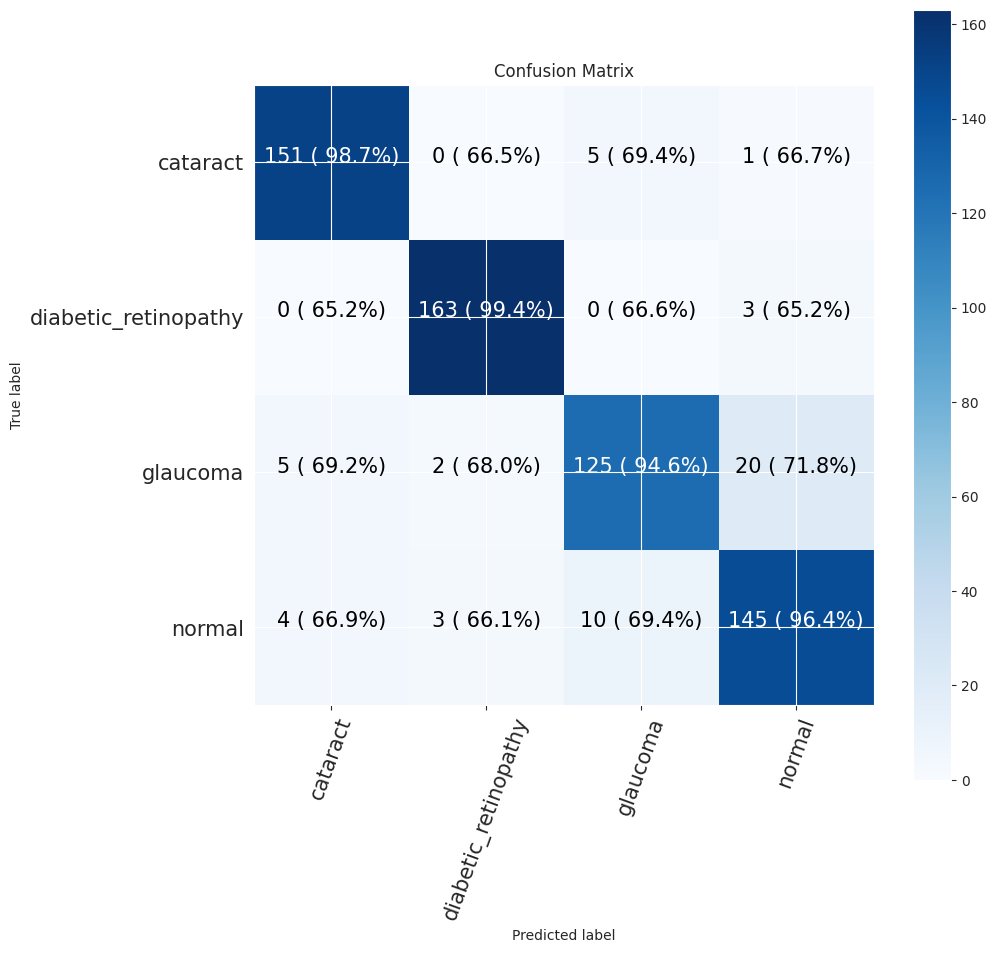

In [154]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


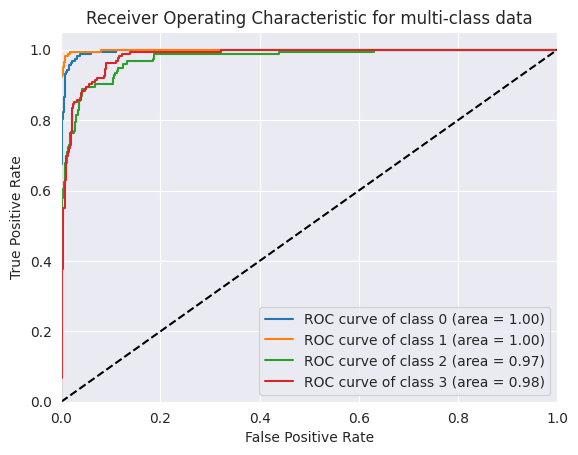

In [155]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch Size: 32**

In [156]:
epoch = 20
batchsize = 32

In [157]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 842 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [158]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [159]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_1  (None, 1536)              0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 dense_36 (Dense)            (None, 32)                49184     
                                                          

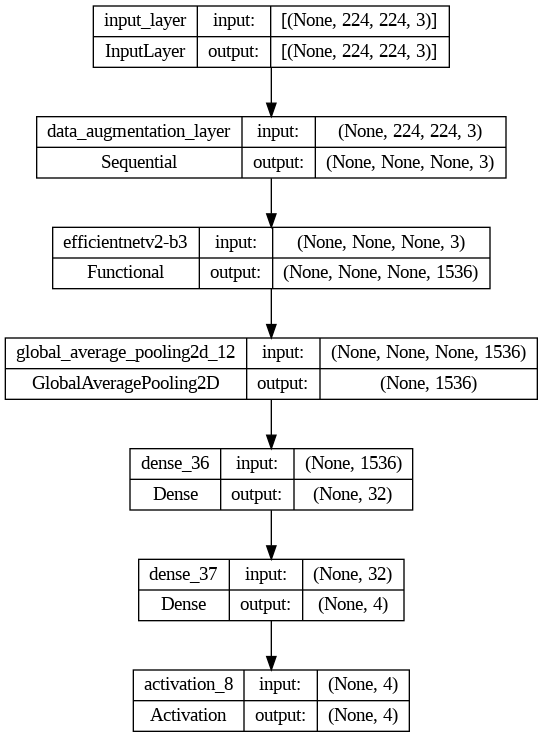

In [160]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [161]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [162]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 27s 143ms/step - loss: 0.6750 - accuracy: 0.7260 - val_loss: 0.4392 - val_accuracy: 0.8361 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 13s 122ms/step - loss: 0.4683 - accuracy: 0.8238 - val_loss: 0.4040 - val_accuracy: 0.8563 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 13s 121ms/step - loss: 0.4281 - accuracy: 0.8366 - val_loss: 0.3558 - val_accuracy: 0.8682 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 13s 122ms/step - loss: 0.4003 - accuracy: 0.8440 - val_loss: 0.4212 - val_accuracy: 0.8551 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 13s 119ms/step - loss: 0.3751 - accuracy: 0.8556 - val_loss: 0.3328 - val_accuracy: 0.8753 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 13s 120ms/step - loss: 0.3759 - accuracy: 0.8556 - val_loss: 0.3695 - val_accuracy: 0.8622 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

EfficientNetV2B3 Evaluation

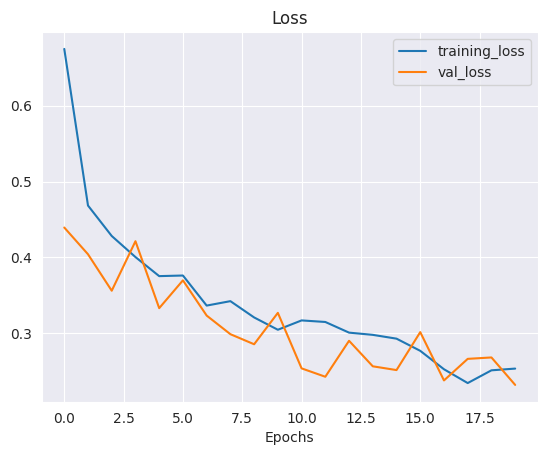

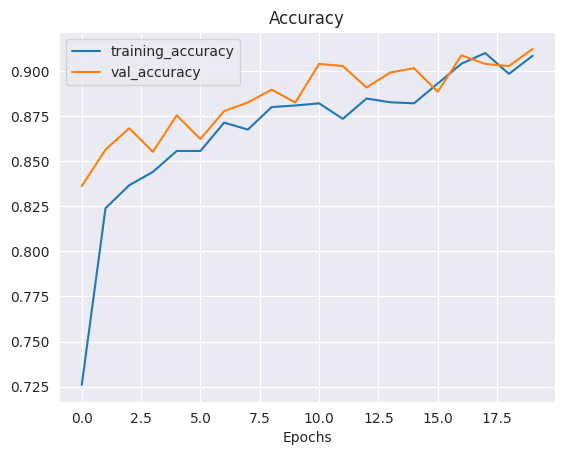

In [163]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 2s 81ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       157
           1       0.98      0.98      0.98       166
           2       0.95      0.80      0.87       152
           3       0.84      0.96      0.90       162

    accuracy                           0.92       637
   macro avg       0.93      0.92      0.92       637
weighted avg       0.93      0.92      0.92       637

Specificity: [0.31069958847736623, 0.3410526315789474, 0.23449612403100775, 0.3215767634854772]
Mean Squared Error: : 0.10780149698257446
The average AUC-ROC is 0.9875882544439176


[0.9873949579831933,
 0.6673728813559322,
 0.696078431372549,
 0.6622516556291391,
 0.6512605042016807,
 0.9915254237288136,
 0.6745098039215687,
 0.6423841059602649,
 0.6974789915966386,
 0.6822033898305084,
 0.9392156862745098,
 0.7108167770419426,
 0.6638655462184874,
 0.6588983050847458,
 0.6901960784313725,
 0.9845474613686535]

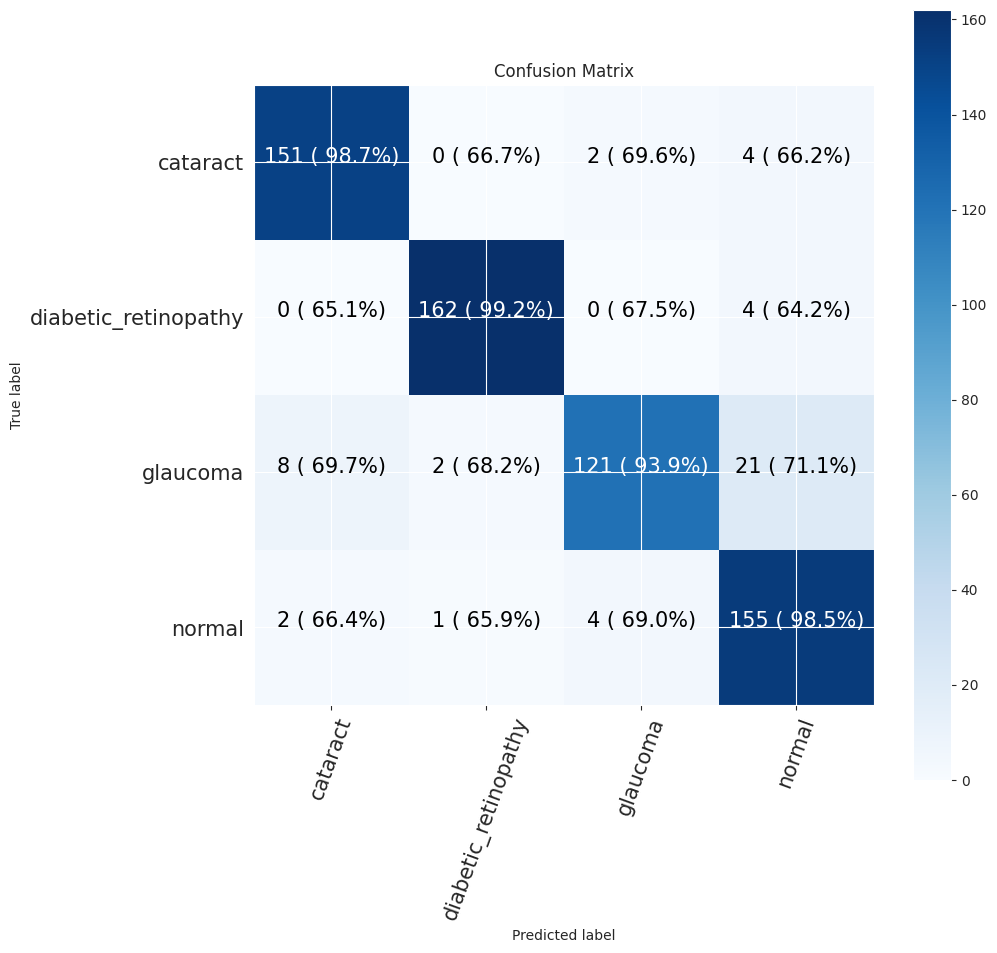

In [164]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


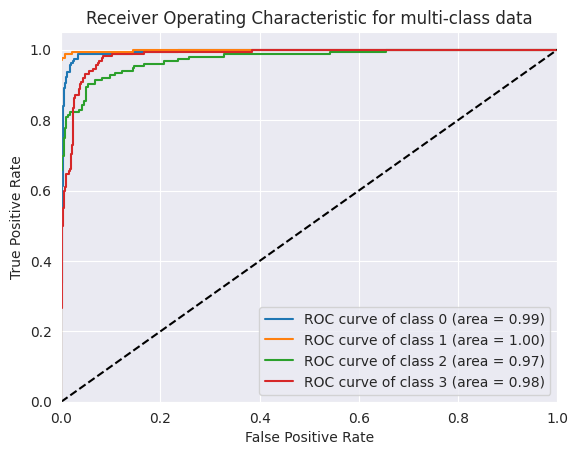

In [165]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [166]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [167]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_21 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 26, 26, 128)      

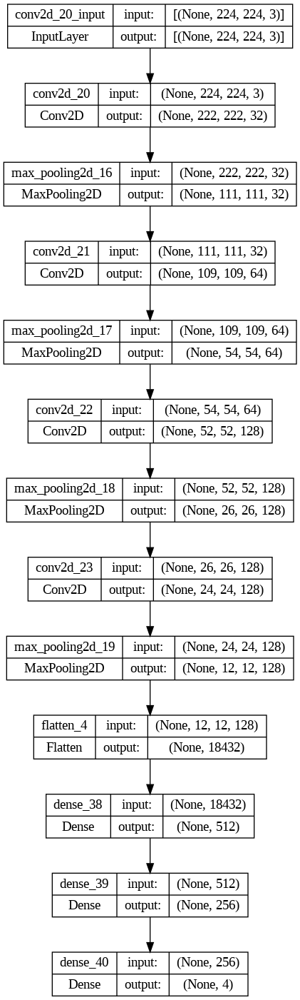

In [168]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [169]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [170]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 6s 42ms/step - loss: 1.3100 - accuracy: 0.5676 - val_loss: 0.3622 - val_accuracy: 0.7126 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 4s 40ms/step - loss: 0.3097 - accuracy: 0.6862 - val_loss: 0.2904 - val_accuracy: 0.7173 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 5s 41ms/step - loss: 0.2844 - accuracy: 0.7150 - val_loss: 0.3024 - val_accuracy: 0.7221 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 5s 41ms/step - loss: 0.2737 - accuracy: 0.7272 - val_loss: 0.2594 - val_accuracy: 0.7625 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 5s 41ms/step - loss: 0.2614 - accuracy: 0.7375 - val_loss: 0.2792 - val_accuracy: 0.7470 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 5s 41ms/step - loss: 0.2592 - accuracy: 0.7461 - val_loss: 0.2533 - val_accuracy: 0.7767 - lr: 0.0010
Epoch 7/20
106/106 [==============================] - 5s 41ms/st

CNN Evaluation

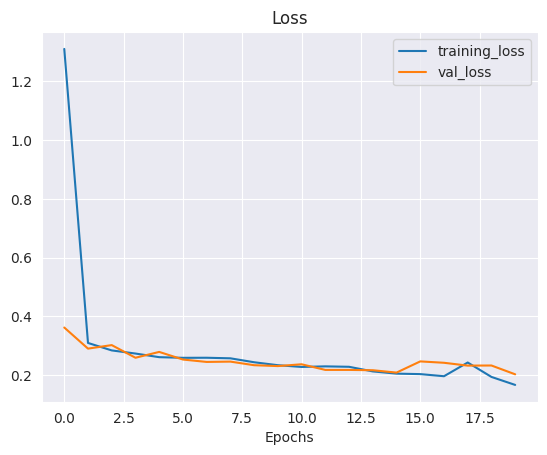

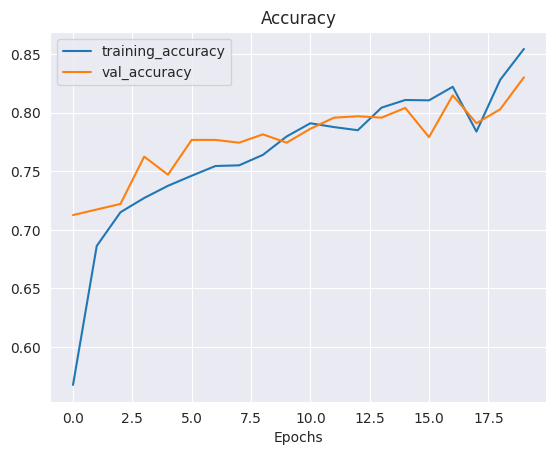

In [171]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 0s 17ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.56      0.59       157
           1       1.00      1.00      1.00       166
           2       0.65      0.54      0.59       152
           3       0.71      0.88      0.79       162

    accuracy                           0.75       637
   macro avg       0.74      0.75      0.74       637
weighted avg       0.75      0.75      0.75       637

Specificity: [0.16029143897996356, 0.3524416135881104, 0.14774774774774774, 0.2894736842105263]
Mean Squared Error: : 0.1297345906496048
The average AUC-ROC is 0.9007053489632141


[0.8603238866396761,
 0.6666666666666666,
 0.7671232876712328,
 0.7103448275862069,
 0.6639676113360324,
 1.0,
 0.675146771037182,
 0.6183908045977011,
 0.7773279352226721,
 0.6772823779193206,
 0.863013698630137,
 0.7149425287356321,
 0.6983805668016194,
 0.6560509554140127,
 0.6947162426614482,
 0.9563218390804598]

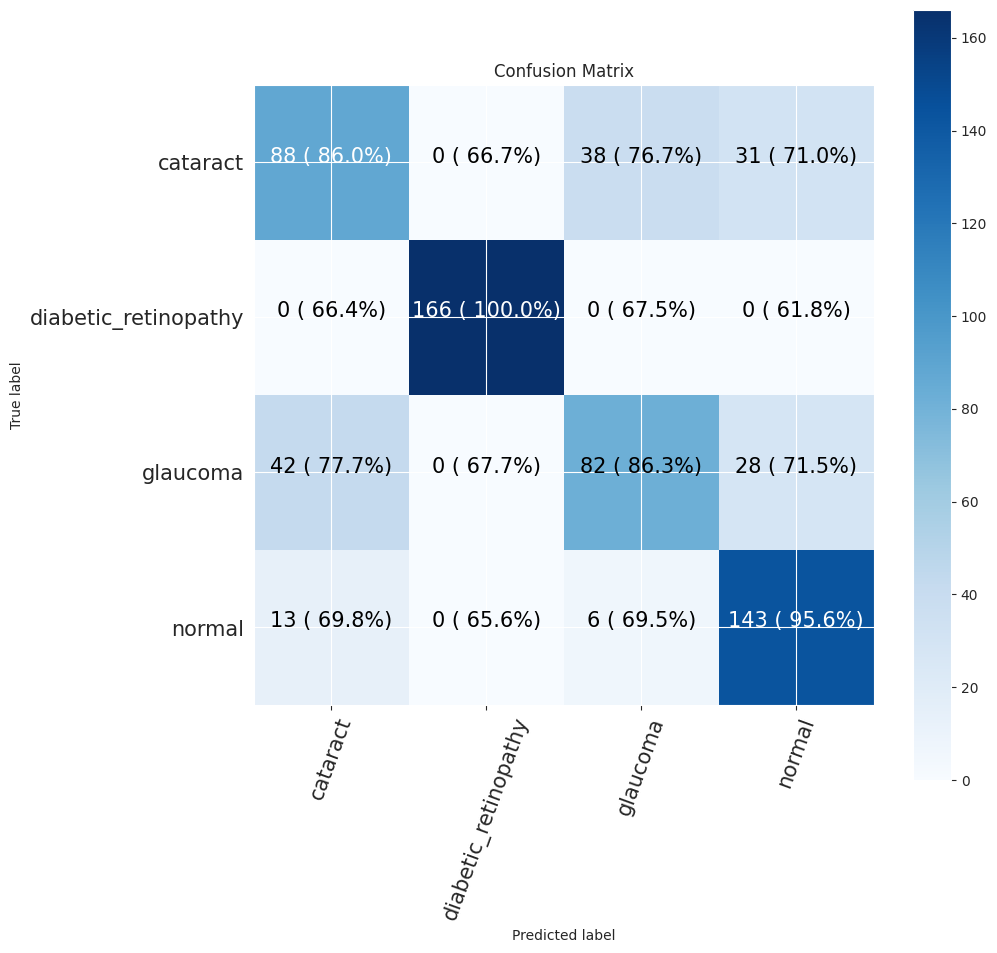

In [172]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


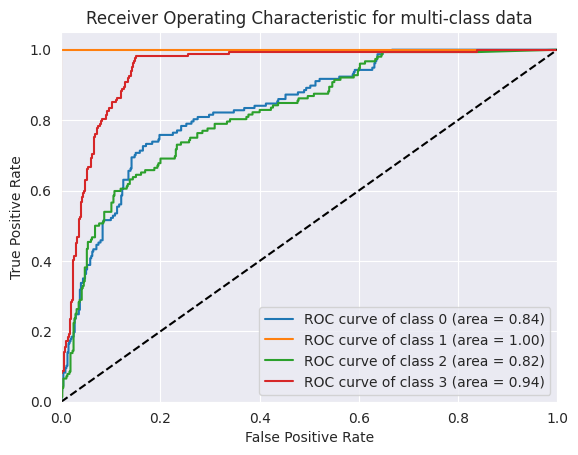

In [173]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [174]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [175]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_24 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 3 (GlobalAveragePooling2D)                                      
                                                                 
 dense_41 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_42 (Dense)            (None, 4)                 4100      
                                                          

In [176]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

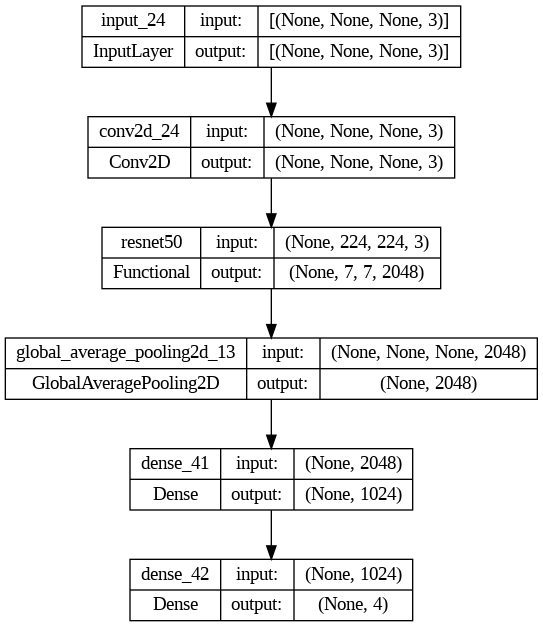

In [177]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [178]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [179]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 34s 284ms/step - loss: 0.2958 - accuracy: 0.7743 - val_loss: 0.1779 - val_accuracy: 0.8599 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 29s 275ms/step - loss: 0.1732 - accuracy: 0.8668 - val_loss: 0.1636 - val_accuracy: 0.8694 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 29s 273ms/step - loss: 0.1499 - accuracy: 0.8849 - val_loss: 0.1330 - val_accuracy: 0.8955 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 29s 275ms/step - loss: 0.1314 - accuracy: 0.8977 - val_loss: 0.1126 - val_accuracy: 0.9181 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 29s 275ms/step - loss: 0.1206 - accuracy: 0.9066 - val_loss: 0.1114 - val_accuracy: 0.9169 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 29s 274ms/step - loss: 0.1092 - accuracy: 0.9181 - val_loss: 0.0976 - val_accuracy: 0.9323 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet50 Evaluation

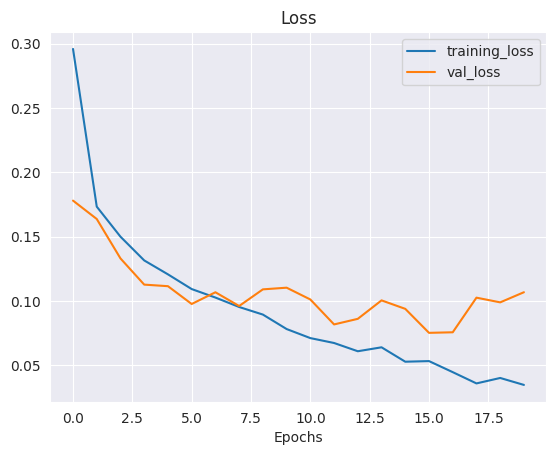

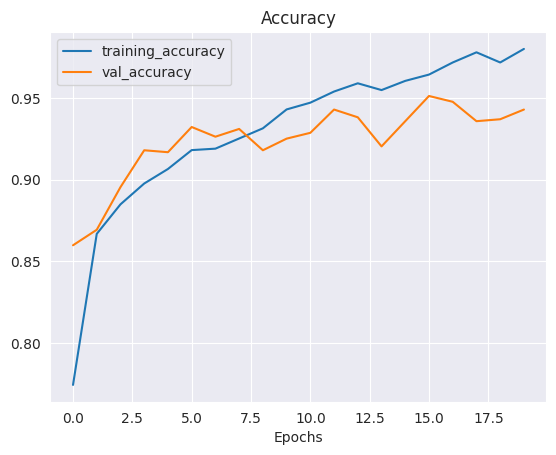

In [180]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 2s 94ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94       157
           1       1.00      0.99      1.00       166
           2       0.95      0.81      0.87       152
           3       0.86      0.93      0.89       162

    accuracy                           0.93       637
   macro avg       0.93      0.93      0.93       637
weighted avg       0.93      0.93      0.93       637

Specificity: [0.3134020618556701, 0.3495762711864407, 0.23929961089494164, 0.31069958847736623]
Mean Squared Error: : 0.10377844423055649
The average AUC-ROC is 0.9836261619080311


[0.9893842887473461,
 0.6673728813559322,
 0.6942800788954635,
 0.665943600867679,
 0.6475583864118896,
 0.9978813559322034,
 0.6725838264299803,
 0.6420824295010846,
 0.6942675159235668,
 0.6779661016949152,
 0.9428007889546351,
 0.7158351409978309,
 0.6687898089171974,
 0.6567796610169492,
 0.6903353057199211,
 0.9761388286334056]

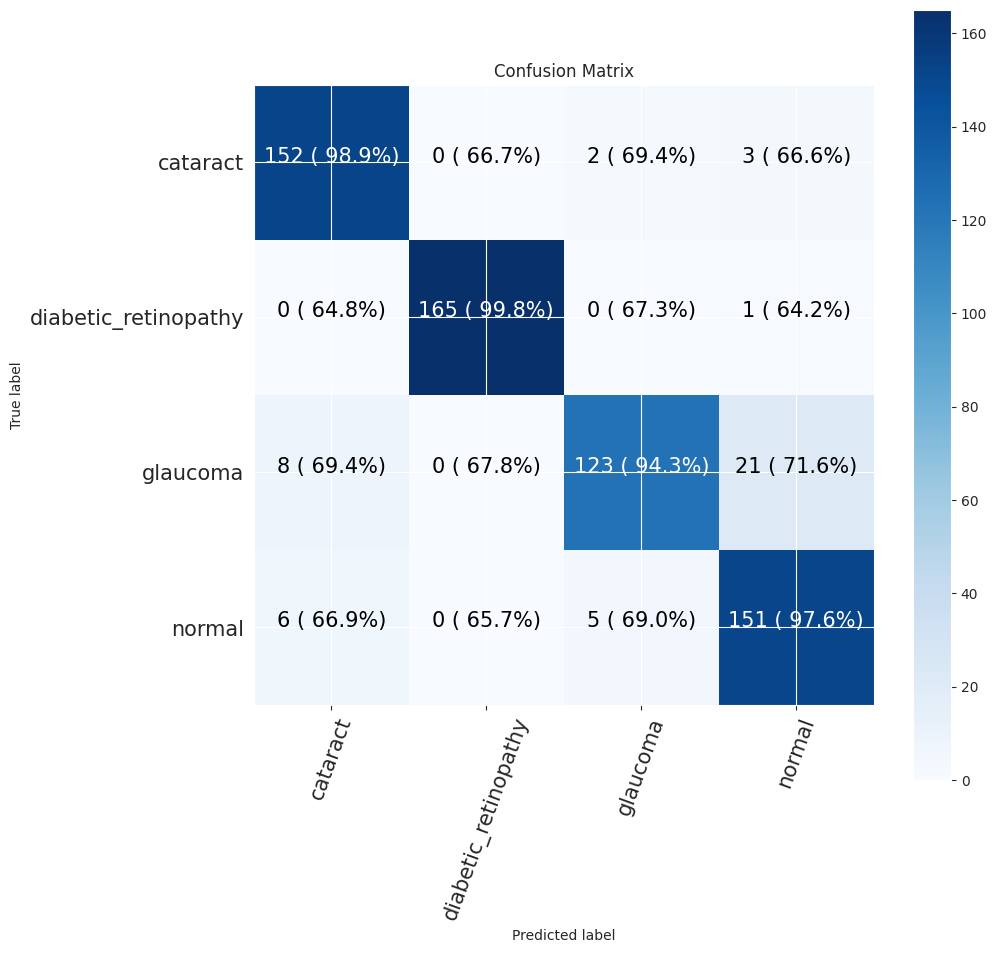

In [181]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


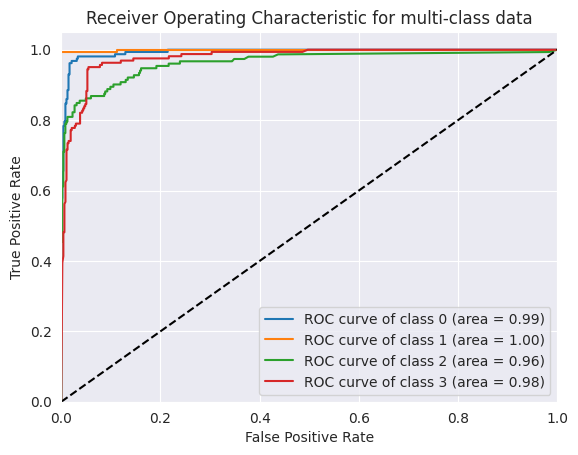

In [182]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [183]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [184]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



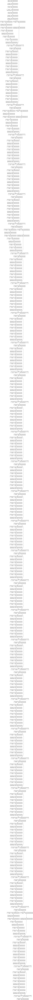

In [185]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [186]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 4 (GlobalAveragePooling2D)                                      
                                                                 
 dense_43 (Dense)            (None, 32)                65568     
                                                          

In [187]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [188]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
106/106 [==============================] - 31s 242ms/step - loss: 0.6472 - accuracy: 0.7381 - val_loss: 0.4954 - val_accuracy: 0.7827 - lr: 0.0010
Epoch 2/20
106/106 [==============================] - 24s 229ms/step - loss: 0.4426 - accuracy: 0.8268 - val_loss: 0.4164 - val_accuracy: 0.8337 - lr: 0.0010
Epoch 3/20
106/106 [==============================] - 25s 231ms/step - loss: 0.3888 - accuracy: 0.8452 - val_loss: 0.4032 - val_accuracy: 0.8254 - lr: 0.0010
Epoch 4/20
106/106 [==============================] - 25s 230ms/step - loss: 0.3557 - accuracy: 0.8645 - val_loss: 0.3787 - val_accuracy: 0.8634 - lr: 0.0010
Epoch 5/20
106/106 [==============================] - 24s 226ms/step - loss: 0.3295 - accuracy: 0.8734 - val_loss: 0.3478 - val_accuracy: 0.8658 - lr: 0.0010
Epoch 6/20
106/106 [==============================] - 25s 236ms/step - loss: 0.3155 - accuracy: 0.8808 - val_loss: 0.3873 - val_accuracy: 0.8694 - lr: 0.0010
Epoch 7/20
106/106 [==============================] 

ResNet101 Evaluation

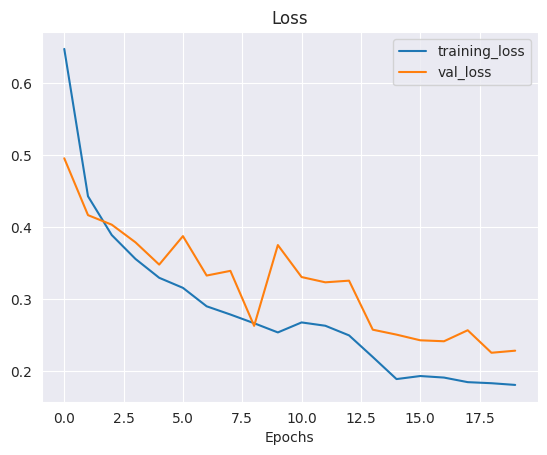

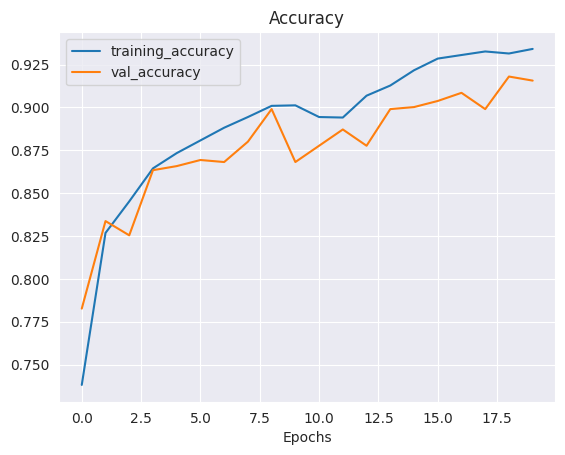

In [189]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 3s 158ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       157
           1       0.96      0.96      0.96       166
           2       0.88      0.83      0.85       152
           3       0.82      0.90      0.86       162

    accuracy                           0.90       637
   macro avg       0.91      0.90      0.90       637
weighted avg       0.91      0.90      0.90       637

Specificity: [0.2920892494929006, 0.33542976939203356, 0.2465753424657534, 0.2973523421588595]
Mean Squared Error: : 0.10861952602863312
The average AUC-ROC is 0.9880452511791954


[0.973305954825462,
 0.6666666666666666,
 0.7018255578093306,
 0.6652173913043479,
 0.6591375770020534,
 0.9872611464968153,
 0.6632860040567952,
 0.6521739130434783,
 0.6919917864476386,
 0.6815286624203821,
 0.947261663286004,
 0.717391304347826,
 0.675564681724846,
 0.6645435244161358,
 0.6876267748478702,
 0.9652173913043478]

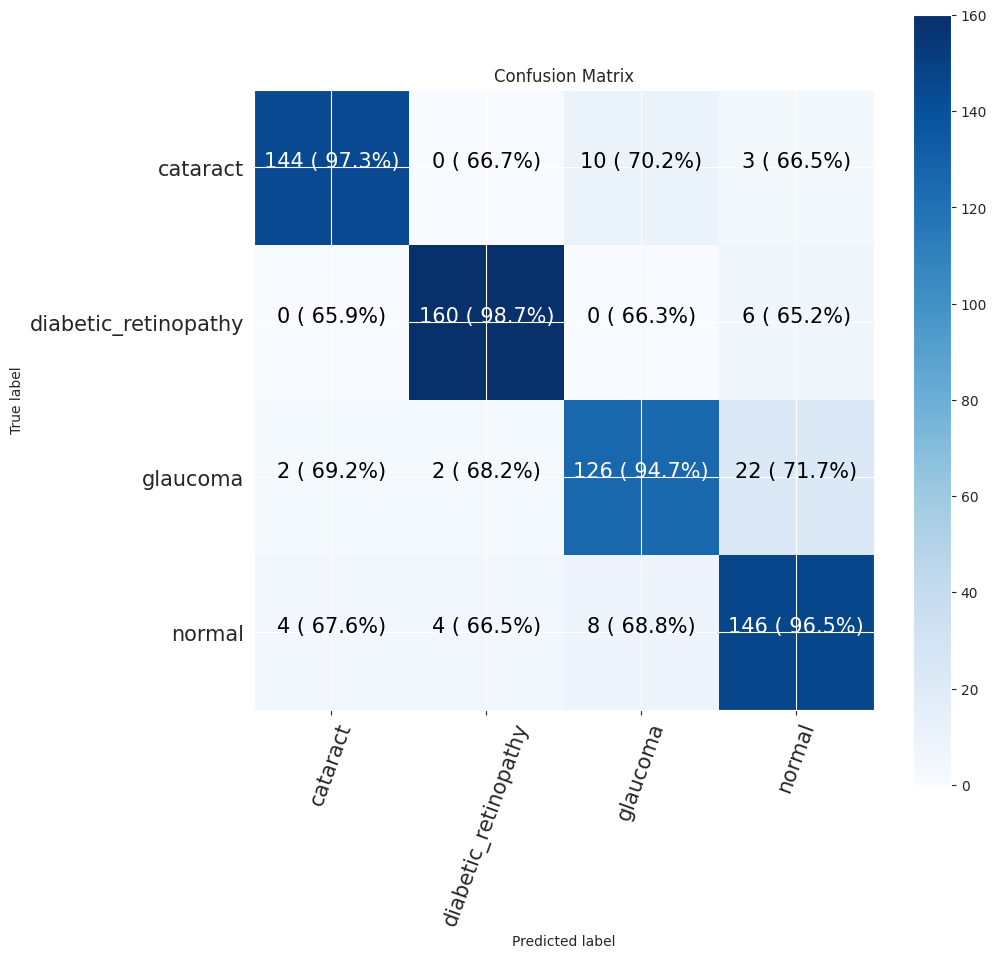

In [190]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


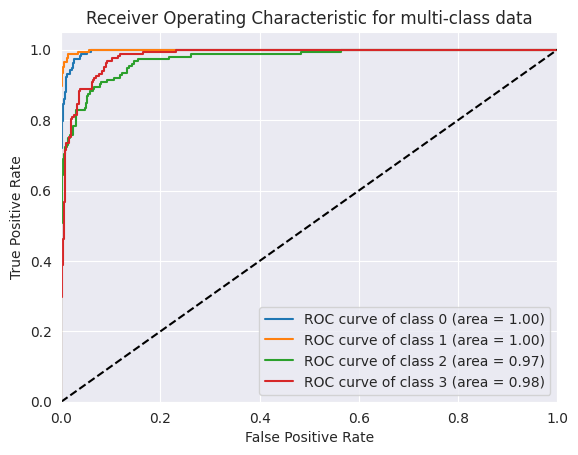

In [191]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **Batch Size: 64**

In [192]:
epoch = 20
batchsize = 64

In [193]:
train_dir = "output1/train"
test_dir =  "output1/test"
val_dir = "output1/val"

train_data = image_dataset_from_directory(train_dir, label_mode="categorical",
                                          image_size=(224, 224), batch_size=batchsize,
                                          shuffle=True, seed=42)

test_data = image_dataset_from_directory(test_dir, label_mode="categorical",
                                         image_size=(224, 224), batch_size=batchsize,
                                         shuffle=False, seed=42)

val_data = image_dataset_from_directory(val_dir, label_mode="categorical",
                                        image_size=(224, 224), batch_size=batchsize,
                                        shuffle=False, seed=42)


Found 3372 files belonging to 4 classes.
Found 637 files belonging to 4 classes.
Found 842 files belonging to 4 classes.


# **EfficientNetV2B3 Model**

In [194]:
efficient_model = tf.keras.applications.EfficientNetV2B3(include_top = False)
efficient_model.trainable = False


In [195]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = efficient_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

efficient_model = tf.keras.Model(inputs, outputs)
efficient_model.summary()

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 efficientnetv2-b3 (Functio  (None, None, None, 1536   12930622  
 nal)                        )                                   
                                                                 
 global_average_pooling2d_1  (None, 1536)              0         
 5 (GlobalAveragePooling2D)                                      
                                                                 
 dense_45 (Dense)            (None, 32)                49184     
                                                          

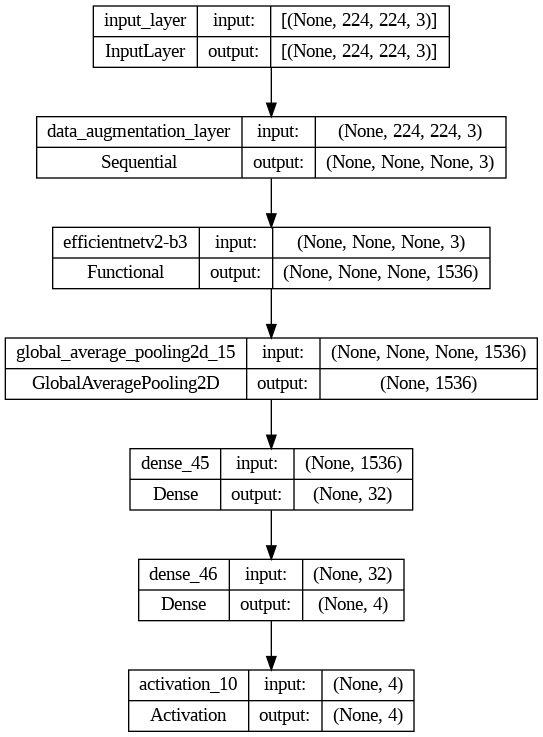

In [196]:
tf.keras.utils.plot_model(efficient_model, show_shapes=True)

In [197]:
efficient_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [198]:
efficient_history = efficient_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 27s 301ms/step - loss: 0.7634 - accuracy: 0.6868 - val_loss: 0.5028 - val_accuracy: 0.7981 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 14s 244ms/step - loss: 0.4965 - accuracy: 0.8105 - val_loss: 0.3994 - val_accuracy: 0.8527 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 14s 249ms/step - loss: 0.4637 - accuracy: 0.8256 - val_loss: 0.4100 - val_accuracy: 0.8385 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 14s 255ms/step - loss: 0.4151 - accuracy: 0.8422 - val_loss: 0.4003 - val_accuracy: 0.8468 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 13s 243ms/step - loss: 0.3951 - accuracy: 0.8550 - val_loss: 0.3875 - val_accuracy: 0.8444 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 13s 242ms/step - loss: 0.3853 - accuracy: 0.8594 - val_loss: 0.3638 - val_accuracy: 0.8515 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 15s 248ms/st

EfficientNetV2B3 Evaluation

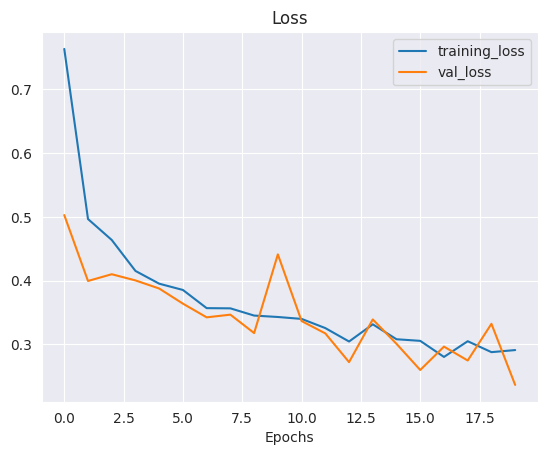

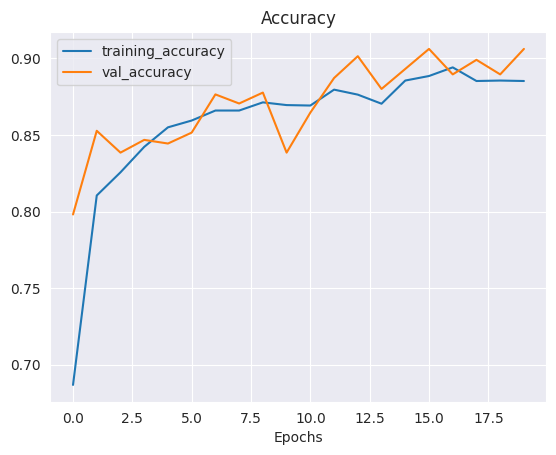

In [199]:
plot_loss_curves(efficient_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 2s 157ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       157
           1       0.98      0.98      0.98       166
           2       0.85      0.84      0.84       152
           3       0.85      0.89      0.87       162

    accuracy                           0.91       637
   macro avg       0.91      0.91      0.91       637
weighted avg       0.91      0.91      0.91       637

Specificity: [0.2920892494929006, 0.3438818565400844, 0.24901960784313726, 0.2920892494929006]
Mean Squared Error: : 0.10960406810045242
The average AUC-ROC is 0.9862598098335389


[0.973305954825462,
 0.6659574468085107,
 0.6940451745379876,
 0.6745182012847966,
 0.6591375770020534,
 0.9936170212765958,
 0.6591375770020534,
 0.6509635974304069,
 0.6981519507186859,
 0.6808510638297872,
 0.9486652977412731,
 0.7130620985010707,
 0.6694045174537988,
 0.6595744680851063,
 0.6981519507186859,
 0.961456102783726]

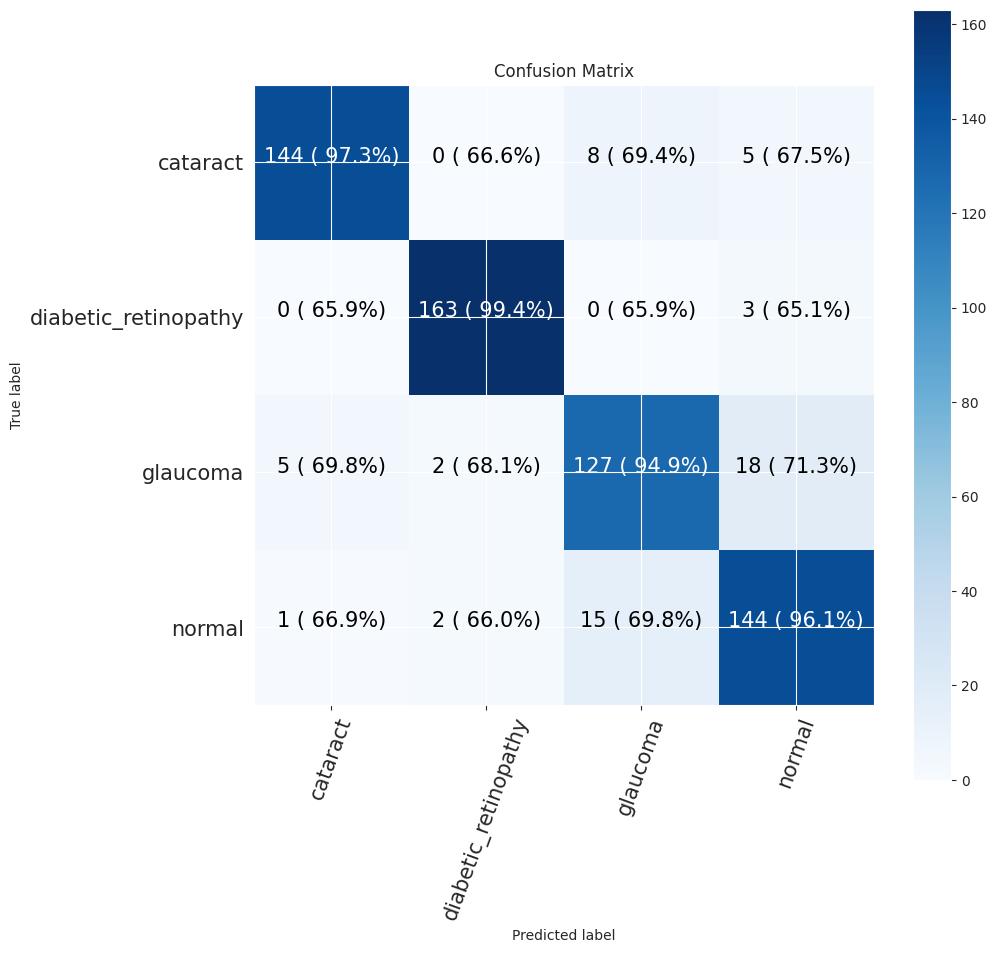

In [200]:
# Save Model
efficient_model.save("efficient_model.h5")

model = efficient_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


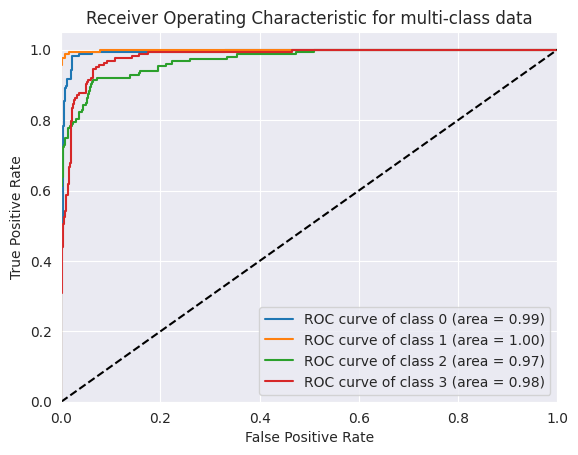

In [201]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **CNN model**

In [202]:
def grayscale_data_augmentation(image):
    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Resize the image to 224x224
    image = tf.image.resize(image, [224, 224])

    # Apply random flips
    data_aug(image)

    return image

In [203]:
from tensorflow.keras.models import Sequential

# Create a Sequential model
cnn_model = Sequential()

# Add convolutional layers for feature extraction
cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))  # Grayscale image has 1 channel

# Freeze the layers in the base model
for layer in cnn_model.layers:
    layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(layers.MaxPooling2D((2, 2)))

# Flatten the output for dense layers
cnn_model.add(layers.Flatten())

# Add dense layers for classification
cnn_model.add(layers.Dense(512, activation='relu'))
cnn_model.add(layers.Dense(256, activation='relu'))
cnn_model.add(layers.Dense(4, activation='softmax'))  # Set num_classes to your specific number of classes

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display model summary
cnn_model.summary()
# cnn_model = Sequential()

# cnn_model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1))) # Grayscale image has 1 channel

# # Freeze the layers in the base model
# for layer in cnn_model.layers:
#     layer.trainable = False

# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = data_aug(grayscale_input)

# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# cnn_model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# cnn_model.add(layers.MaxPooling2D((2, 2)))

# # Flatten the output for dense layers
# cnn_model.add(layers.Flatten())

# # Add dense layers for classification
# cnn_model.add(layers.Dense(512, activation='relu'))
# cnn_model.add(layers.Dense(256, activation='relu'))
# cnn_model.add(layers.Dense(4, activation='softmax')) # Set num_classes to your specific number of classes

# # Display model summary
# cnn_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_20 (MaxPooli  (None, 111, 111, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_26 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 54, 54, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_27 (Conv2D)          (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 26, 26, 128)      

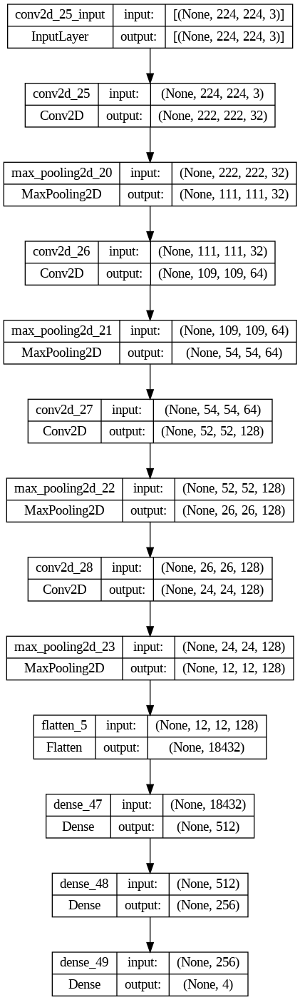

In [204]:
tf.keras.utils.plot_model(cnn_model, show_shapes=True)

In [205]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [206]:
cnn_history = cnn_model.fit(train_data,epochs = epoch, validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 6s 82ms/step - loss: 4.1063 - accuracy: 0.4958 - val_loss: 0.4302 - val_accuracy: 0.6152 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 4s 77ms/step - loss: 0.3480 - accuracy: 0.6518 - val_loss: 0.3029 - val_accuracy: 0.7114 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 5s 77ms/step - loss: 0.2824 - accuracy: 0.7286 - val_loss: 0.2600 - val_accuracy: 0.7637 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 4s 77ms/step - loss: 0.2458 - accuracy: 0.7722 - val_loss: 0.2405 - val_accuracy: 0.7922 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 4s 78ms/step - loss: 0.2992 - accuracy: 0.7180 - val_loss: 0.2968 - val_accuracy: 0.7102 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 4s 78ms/step - loss: 0.2822 - accuracy: 0.7043 - val_loss: 0.2745 - val_accuracy: 0.7316 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 4s 77ms/step - loss: 0.2

CNN Evaluation

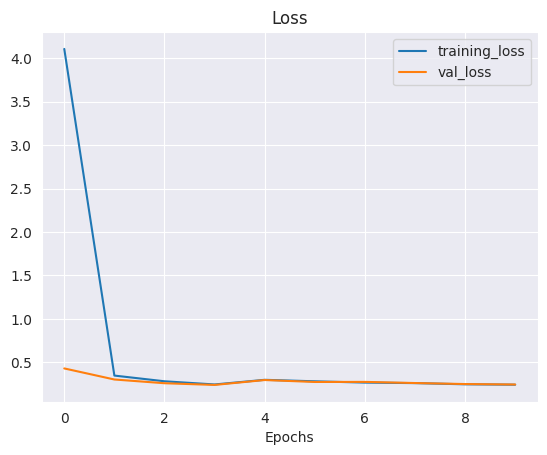

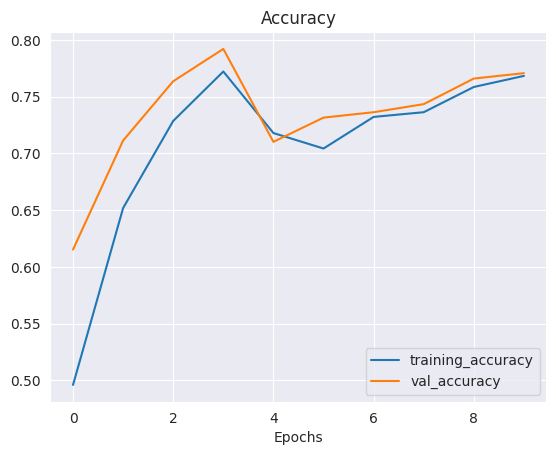

In [207]:
plot_loss_curves(cnn_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 0s 33ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.55      0.59       157
           1       1.00      1.00      1.00       166
           2       0.64      0.49      0.55       152
           3       0.68      0.92      0.78       162

    accuracy                           0.75       637
   macro avg       0.74      0.74      0.73       637
weighted avg       0.74      0.75      0.74       637

Specificity: [0.1560798548094374, 0.3524416135881104, 0.13143872113676733, 0.305327868852459]
Mean Squared Error: : 0.13102936744689941
The average AUC-ROC is 0.9163875520649533


[0.858,
 0.6666666666666666,
 0.7586206896551724,
 0.7200956937799043,
 0.668,
 1.0,
 0.6819923371647509,
 0.6028708133971292,
 0.792,
 0.6772823779193206,
 0.8505747126436781,
 0.7081339712918661,
 0.682,
 0.6560509554140127,
 0.7088122605363985,
 0.9688995215311005]

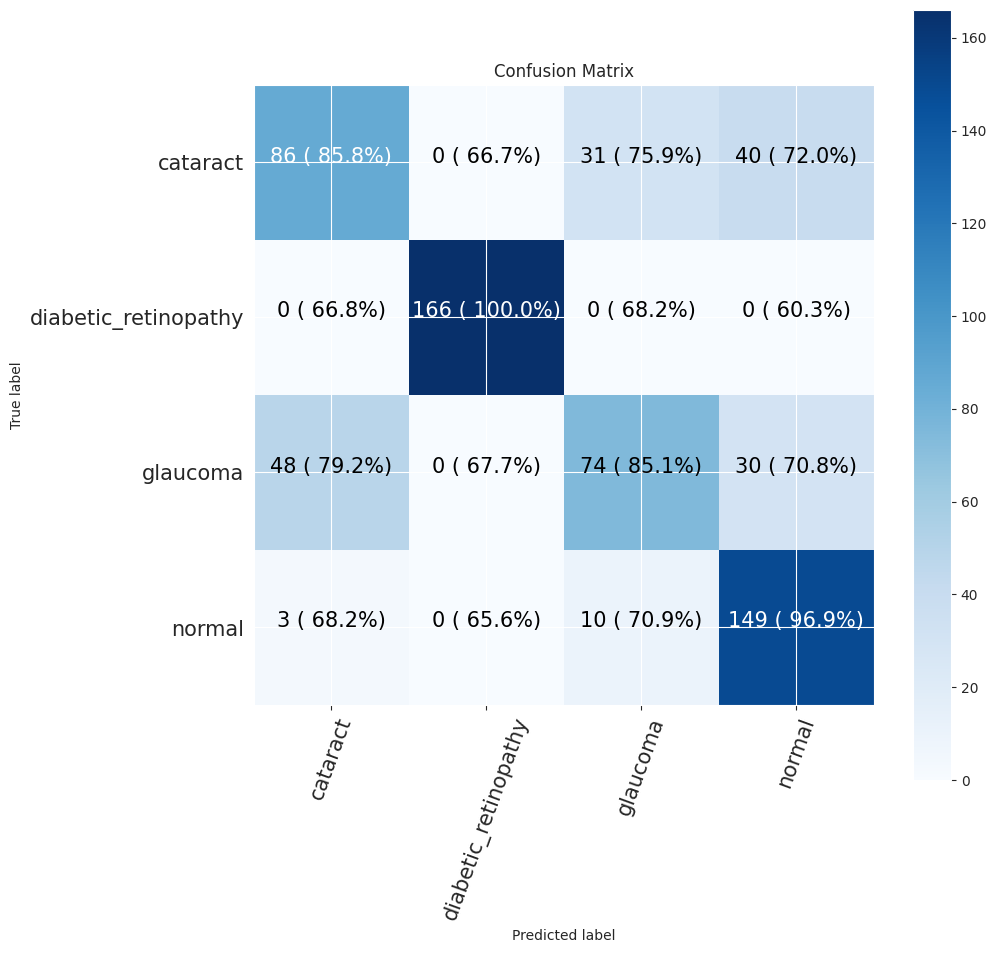

In [208]:
# Save Model
cnn_model.save("cnn_model.h5")

model = cnn_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


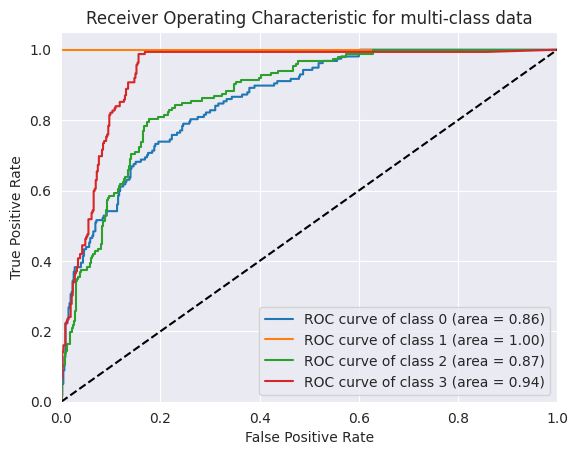

In [209]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet50 Model**



In [210]:
# resnet_model = tf.keras.applications.ResNet50(include_top = False)
# resnet_model.trainable = False

In [211]:
from tensorflow.keras.applications import ResNet50

# Load ResNet-50 without the top classification layers (include_top=False)
resnet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers in the base model
for layer in resnet50_model.layers:
    layer.trainable = False

# Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))

# grayscale_input = Input(shape=(224, 224, 1))
# grayscale_input = data_aug(grayscale_input)
input = data_aug(layers.Input(shape=(224, 224, 3)))
# Convert grayscale to 3 channels (matching the input requirement of ResNet-50)
conv_layer = Conv2D(3, (3, 3), padding='same')(input)

# Use the modified input as the input to the base ResNet-50 model
x = resnet50_model(conv_layer)

# Add custom classification layers
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(1024, activation='relu')(x)
output = layers.Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# Create the modified ResNet-50 model for grayscale images
resnet50_model = Model(inputs=input, outputs=output)

# Display model summary
resnet50_model.summary()


Model: "model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, None, None, 3)]   0         
                                                                 
 conv2d_29 (Conv2D)          (None, None, None, 3)     84        
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 6 (GlobalAveragePooling2D)                                      
                                                                 
 dense_50 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_51 (Dense)            (None, 4)                 4100      
                                                          

In [212]:
# inputs = layers.Input(shape=(224, 224, 1), name="input_layer")
# x = data_aug(inputs)
# # x = inputs
# x = resnet_model(x)

# # Apply Global Average Pooling
# x = layers.GlobalAveragePooling2D()(x)

# x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
# x = layers.Dense(4)(x)
# outputs = layers.Activation("softmax", dtype=tf.float32)(x)

# resnet_model = tf.keras.Model(inputs, outputs)
# resnet_model.summary()

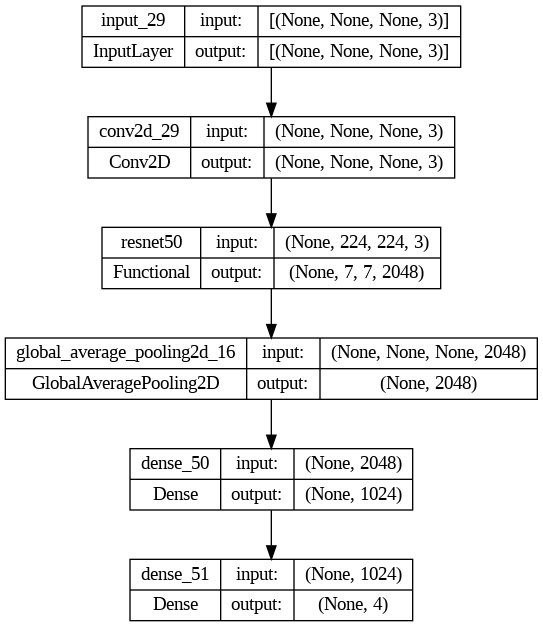

In [213]:
tf.keras.utils.plot_model(resnet50_model, show_shapes=True)

In [214]:
resnet50_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [215]:
resnet50_history = resnet50_model.fit(train_data,epochs = epoch , validation_data = val_data, callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 33s 550ms/step - loss: 0.3713 - accuracy: 0.6948 - val_loss: 0.2178 - val_accuracy: 0.8314 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 29s 537ms/step - loss: 0.1940 - accuracy: 0.8458 - val_loss: 0.1708 - val_accuracy: 0.8789 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 29s 532ms/step - loss: 0.1652 - accuracy: 0.8704 - val_loss: 0.1434 - val_accuracy: 0.8919 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 29s 532ms/step - loss: 0.1435 - accuracy: 0.8906 - val_loss: 0.1290 - val_accuracy: 0.9192 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 29s 535ms/step - loss: 0.1232 - accuracy: 0.9125 - val_loss: 0.1184 - val_accuracy: 0.9240 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 29s 532ms/step - loss: 0.1118 - accuracy: 0.9241 - val_loss: 0.1095 - val_accuracy: 0.9228 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 29s 532ms/st

ResNet50 Evaluation

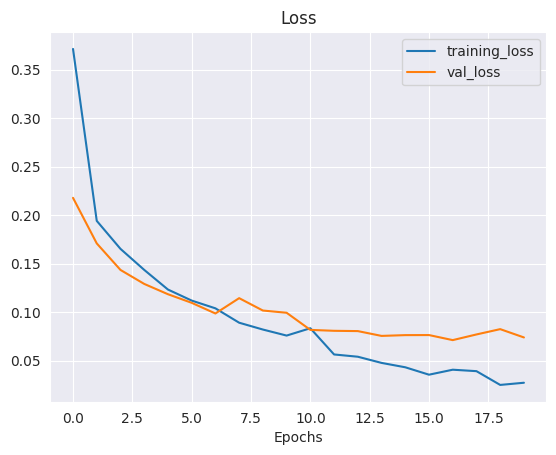

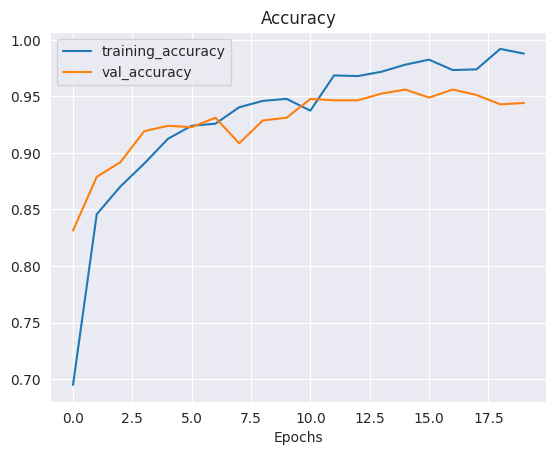

In [216]:
plot_loss_curves(resnet50_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 2s 185ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       157
           1       1.00      0.97      0.98       166
           2       0.78      0.93      0.85       152
           3       0.91      0.82      0.86       162

    accuracy                           0.90       637
   macro avg       0.91      0.90      0.90       637
weighted avg       0.91      0.90      0.90       637

Specificity: [0.28169014084507044, 0.3382352941176471, 0.2842741935483871, 0.2638888888888889]
Mean Squared Error: : 0.1061045378446579
The average AUC-ROC is 0.9834385882856135


[0.9650924024640657,
 0.6701680672268907,
 0.6892778993435449,
 0.6843177189409368,
 0.6611909650924025,
 0.9894957983193278,
 0.6389496717724289,
 0.6680244399185336,
 0.6940451745379876,
 0.680672268907563,
 0.975929978118162,
 0.7067209775967414,
 0.6796714579055442,
 0.6596638655462185,
 0.6958424507658644,
 0.9409368635437881]

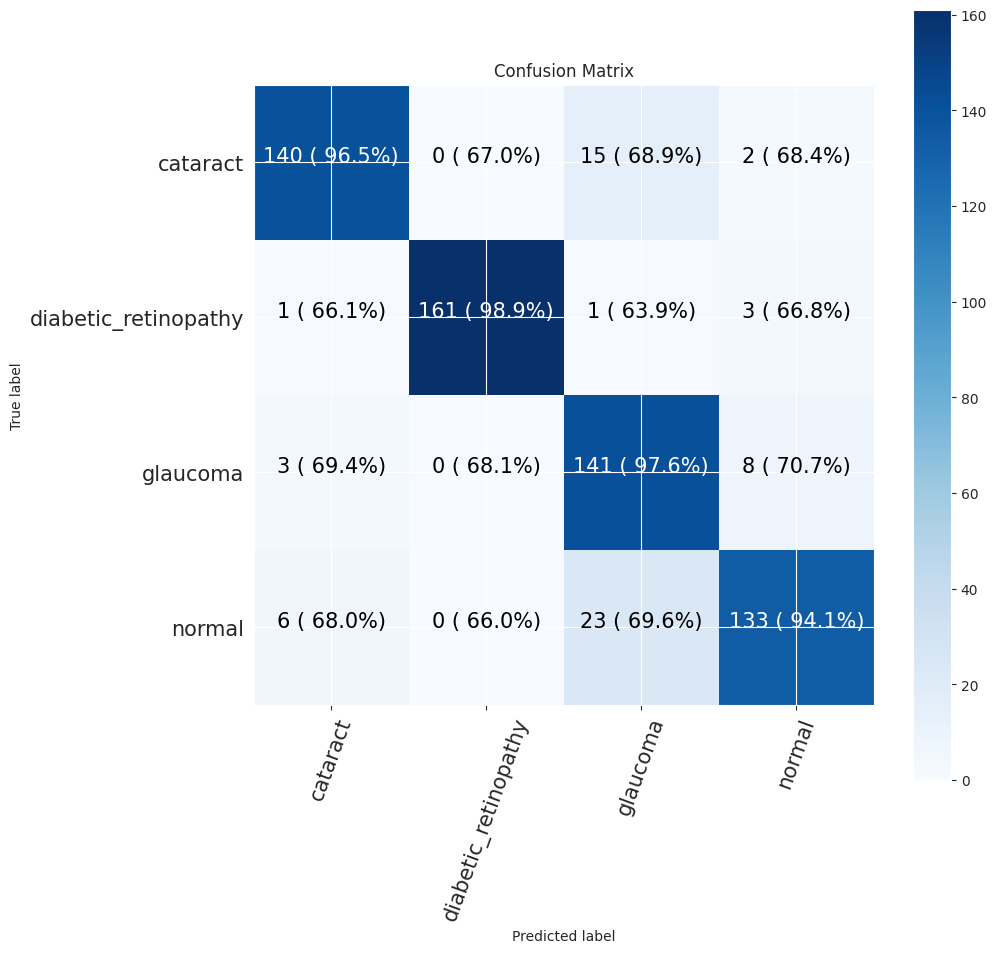

In [217]:
# Save Model
resnet50_model.save("resnet50_model.h5")

model = resnet50_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


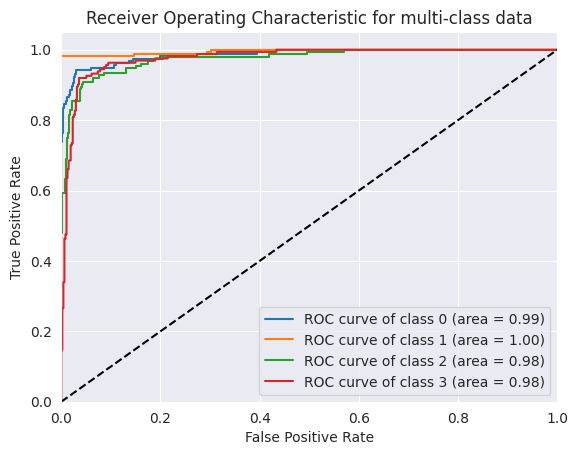

In [218]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# **ResNet101**

In [219]:
# from tensorflow.keras.applications import ResNet101

# # Load ResNet-101 without the top classification layers (include_top=False)
# resnet101_model = ResNet101(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers in the base model
# for layer in resnet101_model.layers:
#     layer.trainable = False

# # Define the input layer for grayscale images (1 channel)
# grayscale_input = layers.Input(shape=(224, 224, 1))
# # grayscale_input = data_aug(grayscale_input)

# # Convert grayscale to 3 channels (matching the input requirement of ResNet-101)
# conv_layer = layers.Conv2D(3, (3, 3), padding='same')(grayscale_input)

# # Use the modified input as the input to the base ResNet-101 model
# x = resnet101_model(conv_layer)

# # Add custom classification layers
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(1024, activation='relu')(x)
# output = Dense(4, activation='softmax')(x)  # Set num_classes to your specific number of classes

# # Create the modified ResNet-101 model for grayscale images
# resnet101_model = Model(inputs=grayscale_input, outputs=output)

# # Compile the model
# resnet101_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Display model summary
# resnet101_model.summary()


In [220]:
resnet101_model = tf.keras.applications.ResNet101(include_top = False)
resnet101_model.trainable = False

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



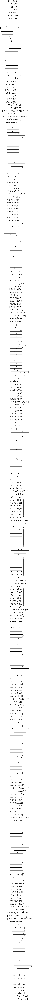

In [221]:
tf.keras.utils.plot_model(resnet101_model, show_shapes=True)

In [222]:
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = data_aug(inputs)
# x = inputs
x = resnet101_model(x)

# Apply Global Average Pooling
x = layers.GlobalAveragePooling2D()(x)

x = layers.Dense(32, activation="relu", kernel_initializer=tf.keras.initializers.he_normal())(x)
x = layers.Dense(4)(x)
outputs = layers.Activation("softmax", dtype=tf.float32)(x)

resnet101_model = tf.keras.Model(inputs, outputs)
resnet101_model.summary()

Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation_layer (S  (None, None, None, 3)     0         
 equential)                                                      
                                                                 
 resnet101 (Functional)      (None, None, None, 2048   42658176  
                             )                                   
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
 7 (GlobalAveragePooling2D)                                      
                                                                 
 dense_52 (Dense)            (None, 32)                65568     
                                                          

In [223]:
resnet101_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

In [224]:
resnet101_history = resnet101_model.fit(train_data,epochs = epoch , validation_data = val_data,
                      callbacks = [early_stop,reduce_lr])

Epoch 1/20
53/53 [==============================] - 32s 482ms/step - loss: 0.7566 - accuracy: 0.7011 - val_loss: 0.6364 - val_accuracy: 0.7375 - lr: 0.0010
Epoch 2/20
53/53 [==============================] - 26s 473ms/step - loss: 0.4906 - accuracy: 0.8099 - val_loss: 0.5319 - val_accuracy: 0.7684 - lr: 0.0010
Epoch 3/20
53/53 [==============================] - 24s 444ms/step - loss: 0.4279 - accuracy: 0.8369 - val_loss: 0.4194 - val_accuracy: 0.8349 - lr: 0.0010
Epoch 4/20
53/53 [==============================] - 26s 482ms/step - loss: 0.4089 - accuracy: 0.8437 - val_loss: 0.4013 - val_accuracy: 0.8504 - lr: 0.0010
Epoch 5/20
53/53 [==============================] - 25s 438ms/step - loss: 0.3803 - accuracy: 0.8511 - val_loss: 0.4923 - val_accuracy: 0.8076 - lr: 0.0010
Epoch 6/20
53/53 [==============================] - 27s 493ms/step - loss: 0.3600 - accuracy: 0.8648 - val_loss: 0.4122 - val_accuracy: 0.8563 - lr: 0.0010
Epoch 7/20
53/53 [==============================] - 24s 432ms/st

ResNet101 Evaluation

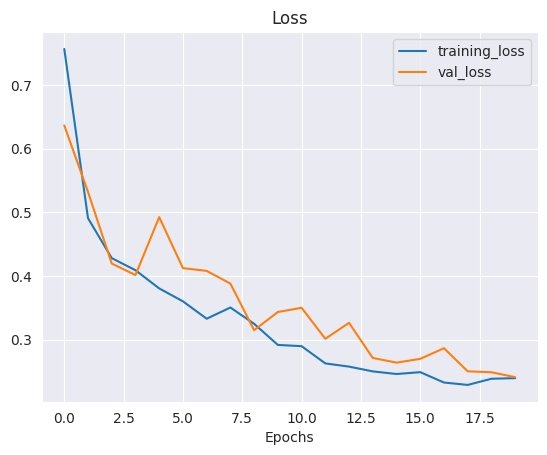

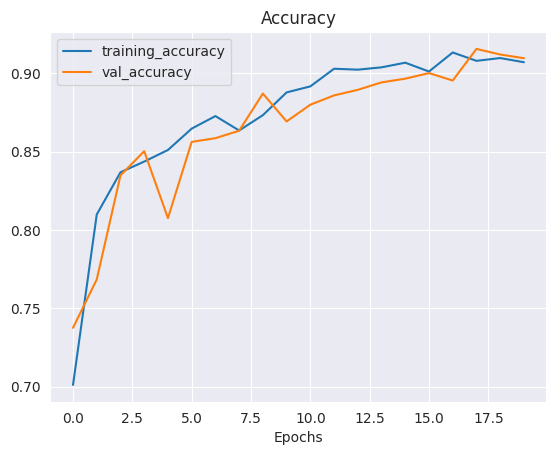

In [225]:
plot_loss_curves(resnet101_history)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 3s 305ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       157
           1       0.96      0.99      0.98       166
           2       0.88      0.83      0.85       152
           3       0.88      0.87      0.87       162

    accuracy                           0.91       637
   macro avg       0.91      0.91      0.91       637
weighted avg       0.91      0.91      0.91       637

Specificity: [0.305327868852459, 0.346723044397463, 0.2465753424657534, 0.2842741935483871]
Mean Squared Error: : 0.10951484739780426
The average AUC-ROC is 0.9868303530221335


[0.9831578947368421,
 0.6638115631691649,
 0.6957403651115619,
 0.6722689075630253,
 0.6505263157894737,
 0.9957173447537473,
 0.6632860040567952,
 0.6554621848739496,
 0.6968421052631579,
 0.6766595289079229,
 0.947261663286004,
 0.7163865546218487,
 0.6694736842105263,
 0.6638115631691649,
 0.6937119675456389,
 0.9558823529411765]

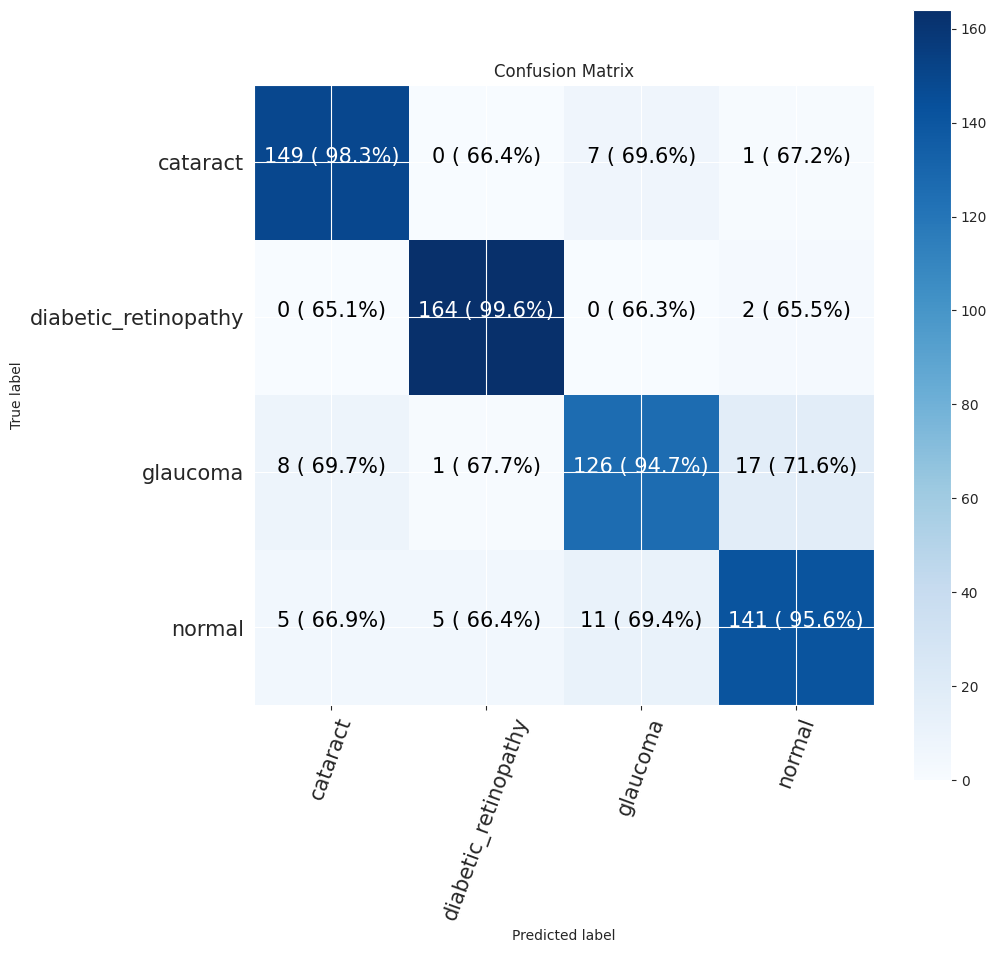

In [226]:
# Save Model
resnet101_model.save("resnet101_model.h5")

model = resnet101_model
X_test_data = test_data

pred_probs = model.predict(test_data)
pred_probs[0]
class_names = train_data.class_names
pred_classes = pred_probs.argmax(axis =1)

y_labels = []
for image,label in test_data.unbatch():
    y_labels.append(label.numpy().argmax())
# y_labels[:20]

# Predict using the model
y_pred = model.predict(test_data)

# Convert raw predictions to probabilities using TensorFlow's softmax function
y_probs = tf.nn.softmax(y_pred, axis=-1)  # Adjust axis if needed

n_classes = 4

# Predict labels
y_pred_labels = predict_labels(model, X_test_data)

# Display classification report
display_classification_report(y_labels, pred_classes)

# Calculate specificity
calculate_specificity(y_labels, pred_classes)

# Calculate MSE
calculate_mse(y_labels, y_probs, n_classes)

# Calculate ROC-AUC score
calculate_roc_auc_score(y_labels, y_probs)

# Confusion matrix
make_confusion_matrix(y_labels,pred_classes,classes = class_names,figsize = (10,10))



/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


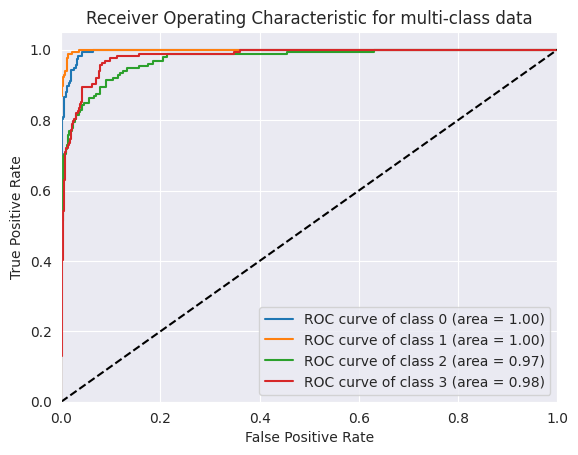

In [227]:
# Convert y_labels to a numpy array
y_labels_array = np.array(y_labels)

# Create a OneHotEncoder instance
encoder = OneHotEncoder(sparse=False)

# Fit the encoder to the y_labels_array and transform it to a binary matrix
y_bin = encoder.fit_transform(y_labels_array.reshape(-1, 1))

# Compute the ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()